<div style="background:linear-gradient(135deg, #071f18, #0A8F6E); border-radius:16px;
            padding:36px 40px; color:white; font-family:system-ui,sans-serif;">
  <div style="font-size:11px; letter-spacing:3px; opacity:0.5; margin-bottom:12px;">MODULE 2 — DEEP LEARNING VISION — TRACK H — 10H EN CLASSE</div>
  <div style="font-size:32px; font-weight:800; line-height:1.2; margin-bottom:12px;">Détecteur de Feux de Foret</div>
  <div style="font-size:15px; opacity:0.75; max-width:620px; line-height:1.6; margin-bottom:20px;">
    Fine-tuning EfficientNet-B0 -- Détection feu/fumée -- GradCAM -- Interface alerte Gradio<br>
    Du dataset brut a une application déployée.</div>
  <div style="display:flex; gap:10px; flex-wrap:wrap;">
    <span style="background:rgba(255,255,255,0.1); padding:5px 14px; border-radius:20px; font-size:12px;">9 étapes guidées</span>
    <span style="background:rgba(255,255,255,0.1); padding:5px 14px; border-radius:20px; font-size:12px;">Cible : AUC > 0.88</span>
    <span style="background:rgba(255,255,255,0.1); padding:5px 14px; border-radius:20px; font-size:12px;">Interface déployée</span>
    <span style="background:rgba(255,255,255,0.1); padding:5px 14px; border-radius:20px; font-size:12px;">Surveillance environnementale</span></div>
</div>

<div style="background:#f8f9fa; border:1px solid #dee2e6; border-radius:12px;
            padding:22px 26px; font-family:system-ui,sans-serif;">
  <div style="font-size:15px; font-weight:700; color:#212529; margin-bottom:14px;">Contexte</div>
  <div style="font-size:13.5px; color:#495057; line-height:1.75; margin-bottom:16px;">
        Vous êtes ingénieur IA dans une agence de protection civile. Le directeur vous demande :
    <em>"Nos cameras de surveillance forêt couvrent 500 km2. Un opérateur humain ne peut pas surveiller
    50 écrans en permanence. Peut-on automatiser la détection des départs de feu pour gagner 30 minutes ?"</em><br><br>
    Votre mission : construire un modèle de détection de feu/fumée sur images de camera,
    vérifier qu'il regarde les flammes/fumée et non le ciel, et créer une interface d'alerte.</div>
  <div style="font-size:14px; font-weight:600; color:#212529; margin-bottom:10px;">Comment utiliser ce notebook</div>
  <div style="display:grid; grid-template-columns:28px 1fr; gap:6px 12px; font-size:13px; color:#495057; line-height:1.7;">
    <span style="font-weight:700; color:#0A8F6E;">1.</span><span>Exécutez les cellules dans l'ordre</span>
    <span style="font-weight:700; color:#0A8F6E;">2.</span><span><span style="color:#131fcf;font-weight:600;">Prompts bleus</span> = du code a écrire dans la cellule vide en dessous</span>
    <span style="font-weight:700; color:#0A8F6E;">3.</span><span><span style="color:#7a0f43;font-weight:600;">Questions rouges</span> = réflexion a rédiger en commentaire Python</span>
    <span style="font-weight:700; color:#0A8F6E;">4.</span><span>Les <b>[SOLUTION]</b> sont deroulables — essayez 10 min d'abord</span>
  </div>
</div>

<div style="border:2px solid #0A8F6E;border-radius:14px;overflow:hidden;margin:20px 0;font-family:system-ui,sans-serif;">
  <div style="background:#0A8F6E;padding:14px 22px;display:flex;align-items:center;gap:12px;">
    <span style="font-size:24px;">🖼️</span>
    <div>
      <div style="font-size:16px;font-weight:700;color:white;">Dataset : Fire Detection Dataset</div>
      <div style="font-size:12px;color:rgba(255,255,255,0.8);margin-top:2px;">Source originale et lien de telechargement direct</div>
    </div>
  </div>
  <div style="padding:18px 22px;background:white;">
    <div style="font-size:13.5px;color:#333;line-height:1.8;margin-bottom:14px;">~2 000 images couleur de paysages. Deux classes : <b>FIRE</b> (presence de feu/incendie) et <b>NO FIRE</b> (paysage normal — foret, montagne, ciel clair).</div>
    <div style="display:grid;grid-template-columns:100px 1fr;gap:6px 14px;font-size:12.5px;color:#495057;line-height:1.7;">
      <span style="font-weight:700;color:#0A8F6E;">Source</span><span>Kaggle — phylake1337/fire-dataset</span>
      <span style="font-weight:700;color:#0A8F6E;">Volume</span><span>~2 000 images couleur</span>
      <span style="font-weight:700;color:#0A8F6E;">URL originale</span><span><a href="https://www.kaggle.com/datasets/phylake1337/fire-dataset" target="_blank" style="color:#0A8F6E;text-decoration:none;">https://www.kaggle.com/datasets/phylake1337/fire-dataset</a></span>
    </div>
    <div style="margin-top:14px;padding-top:12px;border-top:1px solid #eee;"><div style="display:flex;align-items:flex-start;gap:10px;margin:8px 0;"><span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#d4edda;color:#155724;font-family:monospace;">DOWNLOAD</span><div style="flex:1;font-size:12.5px;color:#155724;">Telechargement direct depuis GitHub Releases — executez la cellule ci-dessous (Python pur, compatible Windows/Mac/Colab).</div></div></div>
  </div>
</div>

In [ ]:
# ============================================================
# TELECHARGEMENT DU DATASET
# ============================================================
# Source : Kaggle — phylake1337/fire-dataset
# Telechargement direct (Python pur — compatible Windows/Mac/Colab)

import os, zipfile, urllib.request

zip_name = "Fire-Detection.zip"
url = "https://github.com/archiducarmel/SupDeVinci_M1_MachineLearning_DeepLearning/releases/download/datas/Fire-Detection.zip"
data_dir = "fire_dataset"

if os.path.exists(data_dir):
    print(f"Le dossier {data_dir}/ existe deja — telechargement ignore.")
else:
    print(f"Telechargement de {zip_name}...")
    urllib.request.urlretrieve(url, zip_name)
    print("Decompression...")
    with zipfile.ZipFile(zip_name, 'r') as z:
        z.extractall('.')

    # Nettoyage : supprimer le ZIP
    os.remove(zip_name)
    print("Nettoyage OK.")

# Verification
print(f"\nContenu de {data_dir}/ :")
for split in ["train", "val", "test"]:
    path = os.path.join(data_dir, split)
    if os.path.exists(path):
        n = sum(len(files) for _, _, files in os.walk(path))
        classes = sorted(os.listdir(path))
        print(f"  {split:5s} : {n:>5d} images | classes : {classes}")
    else:
        print(f"  {split:5s} : ABSENT")
print(f"\n✅ Donnees pretes dans ./{data_dir}/")


Telechargement de Fire-Detection.zip...


KeyboardInterrupt: 

<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 01/09 — 30 MIN</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Découverte du dataset</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Voir les données avant de modéliser. Comprendre ce qu'on regarde, détecter les biais, anticiper les difficultés.</div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Pourquoi explorer les images avant tout ?</div><div style="font-size:13.5px;color:#333;line-height:1.8;">En deep learning vision, les données sont des <b>images</b>. Avant de lancer un modèle, trois choses sont indispensables :<br><b>1.</b> <b>Voir</b> a quoi ressemblent les images de chaque classe — les différences sont-elles visibles a l'oeil nu ?<br><b>2.</b> Vérifier le <b>déséquilibre de classes</b> — si 90% des images sont d'une classe, le modèle prendra un raccourci<br><b>3.</b> Observer la <b>qualité et variété</b> des images — taille, éclairage, cadrage, artefacts<br><br><em>Cette étape est la fondation de tout le projet. Un modèle entraîne sur des données biaisées ou mal comprises produira des résultats trompeurs.</em></div></div>

In [ ]:
# ------------------------------------------------------------------
# Imports et configuration
# ------------------------------------------------------------------
import torch
import torchvision
from torchvision import transforms, datasets
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import HTML, display
from collections import Counter

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device : {device}")
if device.type == 'cuda':
    print(f"GPU    : {torch.cuda.get_device_name(0)}")
else:
    print("Pas de GPU — l'entrainement sera plus lent mais fonctionnera.")


Device : cuda
GPU    : Tesla T4


In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

source_dir = "fire_dataset"

fire_dir = os.path.join(source_dir, "fire_images")
non_fire_dir = os.path.join(source_dir, "non_fire_images")

output_dir = "fire_dataset_split"

# Créer les dossiers attendus
for split in ["train", "val", "test"]:
    for cls in ["fire", "no_fire"]:
        os.makedirs(os.path.join(output_dir, split, cls), exist_ok=True)

def get_images(folder):
    return [
        os.path.join(folder, f)
        for f in os.listdir(folder)
        if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp", ".webp"))
    ]

fire_images = get_images(fire_dir)
no_fire_images = get_images(non_fire_dir)

print("Images fire :", len(fire_images))
print("Images no_fire :", len(no_fire_images))

def split_and_copy(images, class_name):
    # 70% train, 15% val, 15% test
    train_imgs, temp_imgs = train_test_split(
        images,
        test_size=0.30,
        random_state=42
    )

    val_imgs, test_imgs = train_test_split(
        temp_imgs,
        test_size=0.50,
        random_state=42
    )

    splits = {
        "train": train_imgs,
        "val": val_imgs,
        "test": test_imgs
    }

    for split_name, split_imgs in splits.items():
        for img_path in split_imgs:
            dest = os.path.join(
                output_dir,
                split_name,
                class_name,
                os.path.basename(img_path)
            )
            shutil.copy2(img_path, dest)

split_and_copy(fire_images, "fire")
split_and_copy(no_fire_images, "no_fire")

print("Dataset séparé créé dans :", output_dir)

Images fire : 755
Images no_fire : 244
Dataset séparé créé dans : fire_dataset_split


<div style="border-left:4px solid #2d5986;background:#2d59860a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#2d5986;margin-bottom:8px;">Le dataset : Fire Detection Dataset</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><div style='display:grid;grid-template-columns:1fr 1fr;gap:10px;'>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;text-align:center;'>
<b style='color:#c0392b;'>FIRE</b><br>Flammes ou fumee visibles<br>(depart de feu, incendie en cours)</div>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;text-align:center;'>
<b style='color:#28a745;'>NO FIRE</b><br>Paysage normal, pas de feu<br>(foret, montagne, ciel clair)</div></div><br><br>Source : <b>Kaggle: phylake1337/fire-dataset</b><br>Volume : ~2 000 images couleur</div></div>

In [ ]:
# ------------------------------------------------------------------
# Charger le dataset
# ------------------------------------------------------------------
# Structure attendue :
#   fire_dataset/
#     train/
#       fire/
#       no_fire/
#     val/
#       fire/
#       no_fire/
#     test/
#       fire/
#       no_fire/

data_dir = "fire_dataset_split" # Adapter selon votre environnement

train_raw = datasets.ImageFolder(os.path.join(data_dir, 'train'))
val_raw = datasets.ImageFolder(os.path.join(data_dir, 'val'))
test_raw = datasets.ImageFolder(os.path.join(data_dir, 'test'))

print(f"Classes : {train_raw.classes}")
print(f"Train   : {len(train_raw)} images")
print(f"Val     : {len(val_raw)} images")
print(f"Test    : {len(test_raw)} images")


Classes : ['fire', 'no_fire']
Train   : 698 images
Val     : 150 images
Test    : 151 images


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Compter les images par classe.</b> L'objectif est de détecter un éventuel déséquilibre qui pourrait biaiser le modèle. Utiliser <code>Counter(train_raw.targets)</code> pour compter les images de chaque classe. Afficher les résultats. Vérifier l'équilibre feu/pas de feu. Les datasets de feux sont souvent équilibrés. Un modèle entraîne sur un dataset déséquilibre risque de toujours prédire la classe majoritaire — il obtient un bon score sans rien avoir appris.</span></p>

In [ ]:
# Votre code ici

class_counts = Counter(train_raw.targets)

print("Répartition des images dans le train set :")
for class_idx, count in class_counts.items():
    class_name = train_raw.classes[class_idx]
    print(f"{class_name} : {count} images")

print("\nVérification de l'équilibre :")
total = sum(class_counts.values())

for class_idx, count in class_counts.items():
    class_name = train_raw.classes[class_idx]
    percentage = count / total * 100
    print(f"{class_name} : {percentage:.2f}%")

Répartition des images dans le train set :
fire : 528 images
no_fire : 170 images

Vérification de l'équilibre :
fire : 75.64%
no_fire : 24.36%


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/vision/stable/generated/torchvision.datasets.ImageFolder.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">torchvision.datasets.ImageFolder</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Documentation officielle — structure attendue des dossiers, paramètres disponibles</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://towardsdatascience.com/handling-imbalanced-datasets-in-deep-learning-f48407a0e758/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Handling Imbalanced Datasets in Deep Learning</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Pourquoi le déséquilibre de classes est dangereux et comment le gérer</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Déséquilibre et coût des erreurs.</b> (1) Le dataset est-il équilibre ? (2) Dans la réalité, les cameras filment 99.9% du temps sans feu. Comment le modèle se comporterait-il dans ces conditions ? (3) Qu'est-ce qui est pire : une fausse alerte (mobiliser les pompiers pour rien — coût ~50 000 EUR) ou un feu non détecté (des milliers d'hectares brûlés, maisons détruites, vies en danger) ?</span></p>

In [ ]:
# Votre reponse ici
print(''' 1 - Le dataset n'est pas équilibré.

Dans le train set, on observe :
- 528 images fire, soit 75,64 %
- 170 images no_fire, soit 24,36 %

Il y a donc beaucoup plus d'images avec feu que d'images sans feu. Le modèle risque d'être biaisé vers la classe majoritaire, c'est-à-dire fire.

2 - Dans la réalité les caméras filment presque toujours des scènes sans feu environ 99,9 % du temps.

Cela crée un décalage important entre le dataset d'entraînement et les conditions réelles.
Comme le modèle a vu beaucoup d'images de feu pendant l'entraînement il pourrait avoir tendance à prédire trop souvent fire dans la réalité.
Cela provoquerait beaucoup de fausses alertes.
Même si le modèle semble performant sur le dataset de test il pourrait être moins fiable en conditions réelles car les images sans feu seraient beaucoup plus fréquentes que dans le dataset d'entraînement.

3 - Les deux erreurs ont un coût, mais elles ne sont pas équivalentes.

Une fausse alerte peut coûter cher par exemple environ 50 000 EUR si elle mobilise inutilement les pompiers.
Cependant un feu non détecté est généralement beaucoup plus grave : il peut détruire des milliers d'hectares, des maisons, des écosystèmes et mettre des vies humaines en danger.
Dans ce type d'application il vaut donc mieux accepter quelques fausses alertes plutôt que de manquer un vrai feu.
Le modèle devrait être réglé pour minimiser les feux non détectés donc maximiser le rappel de la classe fire.''')

 1 - Le dataset n'est pas équilibré.

Dans le train set, on observe :
- 528 images fire, soit 75,64 %
- 170 images no_fire, soit 24,36 %

Il y a donc beaucoup plus d'images avec feu que d'images sans feu. Le modèle risque d'être biaisé vers la classe majoritaire, c'est-à-dire fire.

2 - Dans la réalité les caméras filment presque toujours des scènes sans feu environ 99,9 % du temps.

Cela crée un décalage important entre le dataset d'entraînement et les conditions réelles.
Comme le modèle a vu beaucoup d'images de feu pendant l'entraînement il pourrait avoir tendance à prédire trop souvent fire dans la réalité.
Cela provoquerait beaucoup de fausses alertes.
Même si le modèle semble performant sur le dataset de test il pourrait être moins fiable en conditions réelles car les images sans feu seraient beaucoup plus fréquentes que dans le dataset d'entraînement.

3 - Les deux erreurs ont un coût, mais elles ne sont pas équivalentes.

Une fausse alerte peut coûter cher par exemple environ 5

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Visualiser des exemples de chaque classe.</b> L'objectif est de développer votre intuition visuelle sur les données — avant même que le modèle ne les voie. Afficher une grille d'images : 8 images par classe sur des lignes separees. Utiliser <code>plt.subplots</code>. Pour chaque image : <code>img, label = train_raw[index]</code> puis <code>imshow(img)</code>. Ajouter le nom de la classe en titre. Observez attentivement : voyez-vous les différences ?</span></p>

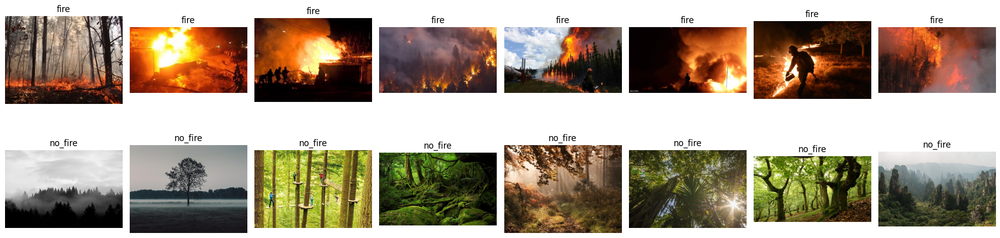

In [ ]:
# Votre code ici

import matplotlib.pyplot as plt

n_images = 8
classes = train_raw.classes

fig, axes = plt.subplots(len(classes), n_images, figsize=(20, 6))

for class_idx, class_name in enumerate(classes):
    # Récupérer les indices des images appartenant à cette classe
    indices = [
        i for i, label in enumerate(train_raw.targets)
        if label == class_idx
    ]

    # Afficher les 8 premières images de cette classe
    for j in range(n_images):
        img, label = train_raw[indices[j]]

        axes[class_idx, j].imshow(img)
        axes[class_idx, j].set_title(class_name)
        axes[class_idx, j].axis("off")

plt.tight_layout()
plt.show()

<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">matplotlib.pyplot.subplots</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Référence pour créer des grilles d'images avec subplots</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#f3e5f5;color:#6c3483;font-family:monospace;flex-shrink:0;white-space:nowrap;">TUTO</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/tutorials/beginner/data_loading_tutorial.html" target="_blank" style="font-size:12.5px;color:#6c3483;font-weight:600;text-decoration:none;">Visualizing image datasets in PyTorch</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tutorial officiel PyTorch sur le chargement et la visualisation de datasets d'images</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Observer les images comme un opérateur de surveillance.</b> (1) Les images de feu montrent-elles toujours des flammes visibles, ou parfois seulement de la fumée ? (2) Y a-t-il des images 'no_fire' qui pourraient tromper le modèle (coucher de soleil orange, brume, nuages bas) ? (3) Les conditions d'éclairage varient-elles beaucoup (jour, nuit, crépuscule) ?</span></p>

In [ ]:
# Votre reponse ici
print('''
1 - Les images de feu ne montrent pas toujours uniquement des flammes très visibles.

Dans plusieurs images on voit clairement de grandes flammes avec des couleurs orange, jaunes ou rouges.
Mais certaines images montrent aussi beaucoup de fumée parfois avec des flammes plus petites cachées.
Cela signifie que le modèle devra apprendre à reconnaître non seulement les flammes mais aussi les indices visuels associés aux incendies comme la fumée ou les zones brûlées.

2 - Oui certaines images no_fire pourraient tromper le modèle.

On observe des images avec de la brume, du brouillard, des nuages bas ou une forte luminosité dans la forêt.
Ces éléments peuvent ressembler à de la fumée.
Certaines scènes avec une lumière chaude par exemple au lever ou au coucher du soleil pourraient aussi être confondues avec un feu si le modèle se base trop sur les couleurs orange ou jaunes.

3 - Les conditions d'éclairage varient beaucoup.

Les images de feu incluent des scènes de jour, de nuit et des scènes très sombres éclairées par les flammes.
Les images no_fire montrent aussi des conditions variées : forêt lumineuse, forêt sombre, brume, brouillard, ciel gris.
Cette diversité est utile pour rendre le modèle plus robuste mais elle rend aussi la tâche plus difficile car le modèle doit distinguer un vrai feu d'effets visuels liés à la lumière ou à la météo.''')


1 - Les images de feu ne montrent pas toujours uniquement des flammes très visibles.

Dans plusieurs images on voit clairement de grandes flammes avec des couleurs orange, jaunes ou rouges.
Mais certaines images montrent aussi beaucoup de fumée parfois avec des flammes plus petites cachées.
Cela signifie que le modèle devra apprendre à reconnaître non seulement les flammes mais aussi les indices visuels associés aux incendies comme la fumée ou les zones brûlées.

2 - Oui certaines images no_fire pourraient tromper le modèle.

On observe des images avec de la brume, du brouillard, des nuages bas ou une forte luminosité dans la forêt.
Ces éléments peuvent ressembler à de la fumée.
Certaines scènes avec une lumière chaude par exemple au lever ou au coucher du soleil pourraient aussi être confondues avec un feu si le modèle se base trop sur les couleurs orange ou jaunes.

3 - Les conditions d'éclairage varient beaucoup.

Les images de feu incluent des scènes de jour, de nuit et des scènes

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Vérifier la taille des images.</b> Les images du dataset n'ont pas nécessairement toutes la même taille. Afficher la taille de 5 images avec <code>train_raw[i][0].size</code>. Si les tailles varient, c'est normal — l'étape 2 (Resize) uniformisera tout. Mais c'est important de le savoir avant, car cela explique pourquoi le preprocessing est indispensable.</span></p>

In [ ]:
# Votre code ici
for i in range(5):
    img, label = train_raw[i]
    class_name = train_raw.classes[label]
    print(f"Image {i} | Classe : {class_name} | Taille : {img.size}")

Image 0 | Classe : fire | Taille : (450, 338)
Image 1 | Classe : fire | Taille : (600, 338)
Image 2 | Classe : fire | Taille : (674, 485)
Image 3 | Classe : fire | Taille : (530, 298)
Image 4 | Classe : fire | Taille : (1050, 591)


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Calculer la taille totale du dataset en mégaoctets.</b> L'objectif est de comprendre la 'quantité' de données que le modèle devra traiter. Pour une image de taille WxHx3 canaux, le nombre de valeurs = W*H*3. Multipliez par le nombre d'images du train set. Ce chiffre explique pourquoi on a besoin de GPUs : un CPU serait trop lent pour traiter autant de données des milliers de fois (epochs).</span></p>

In [ ]:
# Votre code ici
# Taille d'une image : train_raw[0][0].size
# Nombre total de valeurs : W * H * 3 * nb_images

img, label = train_raw[0]
W, H = img.size

nb_images = len(train_raw)

total_values = W * H * 3 * nb_images
total_mb = total_values / (1024 ** 2)

print(f"Taille d'une image : {W} x {H}")
print(f"Nombre d'images : {nb_images}")
print(f"Nombre total de valeurs : {total_values:,}")
print(f"Taille approximative du dataset : {total_mb:.2f} MB")


Taille d'une image : 450 x 338
Nombre d'images : 698
Nombre total de valeurs : 318,497,400
Taille approximative du dataset : 303.74 MB


In [ ]:
# CHECKPOINT — Etape 1
assert len(train_raw.classes) == 2
display(HTML('<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 1 validee.</b> <span style="color:#1e5631;">Dataset explore. Classes et desequilibre identifies.</span></div>'))


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 02/09 — 30 MIN</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Transforms et DataLoaders</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Préparer les images pour le ViT : taille fixe, normalisation, augmentation. C'est le pipeline de preprocessing.</div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Pourquoi transformer les images ?</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Le ViT attend des images dans un format précis :<br><b>1. Taille fixe 224x224</b> — toutes les images doivent avoir la même taille<br><b>2. 3 canaux RGB</b><br><b>3. Normalisation ImageNet</b> : mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225] — ce sont les statistiques du dataset original du ViT. Les utiliser permet au modèle de retrouver ses repères.<br><b>4. Tenseur PyTorch</b> — conversion du format image (PIL) au format calcul (tenseur)<br><br><em>Analogie : c'est comme traduire un texte dans la langue du modèle. Si on ne normalise pas correctement, le modèle reçoit des données dans un 'dialecte' qu'il ne comprend pas.</em></div></div>

<div style="border-left:4px solid #e67e22;background:#e67e220a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#e67e22;margin-bottom:8px;">Data augmentation — plus de variété pour mieux généraliser</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Le data augmentation applique des transformations aléatoires (flip, rotation, recadrage) aux images d'entraînement pour créer de la diversité artificielle.<br><br><b>Objectif :</b> empêcher le modèle de mémoriser les images exactes. S'il voit la même image sous différents angles, il apprend les CARACTÉRISTIQUES du sujet, pas la photo spécifique.<br><br><b>Règle d'or :</b> l'augmentation ne s'applique <b>JAMAIS au val/test</b>. Pourquoi ? L'évaluation doit se faire sur les images réelles, pas sur des versions deformees.<br><br><em>Analogie : un étudiant qui s'entraîne sur des variantes d'exercices (chiffres différents, contextes différents) apprend mieux que celui qui refait le même exercice 50 fois.</em></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Définir les transforms pour le train set.</b> L'objectif est de créer le pipeline de preprocessing complet qui transforme une image brute en tenseur prêt pour le ViT. Enchaîner dans un <code>transforms.Compose</code> : <code>Resize((224, 224))</code>, <code>RandomHorizontalFlip()</code>, <code>RandomRotation(10)</code>, <code>ToTensor()</code>, <code>Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])</code>. Chaque opération a un rôle précis — ne sautez aucune étape.</span></p>

In [ ]:
# Votre code ici
# train_transform = transforms.Compose([...])


train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/vision/stable/transforms.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">torchvision.transforms</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Liste complète des transformations disponibles : Resize, Normalize, RandomFlip, etc.</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://neptune.ai/blog/data-augmentation-in-pytorch" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Data Augmentation in PyTorch</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide complet sur l'augmentation de données avec exemples visuels</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/vision/stable/models.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">ImageNet normalization values</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Pourquoi mean=[0.485,0.456,0.406] et std=[0.229,0.224,0.225] — statistiques du dataset original</div></div></div></div>

<div style="border-left:4px solid #d4a017;background:#fef9e7;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#7d6608;">Attention</div><div style="font-size:13px;color:#6e5b08;line-height:1.7;margin-top:4px;">L'augmentation (<code>RandomHorizontalFlip</code>, <code>RandomRotation</code>) ne s'applique qu'au <b>train</b>. Le val et le test utilisent le même pipeline SANS augmentation. Sinon, l'évaluation est faussée — vous mesureriez la performance sur des images deformees qui n'existent pas dans la réalité.</div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Définir les transforms pour val et test.</b> Même pipeline que le train mais SANS les augmentations aléatoires. Garder uniquement : <code>Resize((224, 224))</code>, <code>ToTensor()</code>, <code>Normalize(...)</code>. C'est le pipeline 'propre' qui sera utilisé pour l'évaluation et en production.</span></p>

In [ ]:
# Votre code ici
# val_transform = transforms.Compose([...])


val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Créer les datasets et DataLoaders.</b> Recharger les ImageFolder avec les transforms, puis créer les DataLoaders (batch_size=16, shuffle=True pour train, False pour val/test). Le DataLoader découpe le dataset en mini-lots que le modèle traitera un par un pendant l'entraînement.</span></p>

In [ ]:
from torch.utils.data import DataLoader

# Votre code ici

train_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "train"),
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "val"),
    transform=val_transform
)

test_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "test"),
    transform=test_transform
)

batch_size = 16

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False
)

print("Datasets et DataLoaders créés.")
print(f"Train : {len(train_dataset)} images")
print(f"Val   : {len(val_dataset)} images")
print(f"Test  : {len(test_dataset)} images")
print(f"Batch size : {batch_size}")


Datasets et DataLoaders créés.
Train : 698 images
Val   : 150 images
Test  : 151 images
Batch size : 16


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/stable/data.html#torch.utils.data.DataLoader" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">torch.utils.data.DataLoader</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Documentation officielle — batch_size, shuffle, num_workers expliques</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Visualiser un batch transforme.</b> L'objectif est de vérifier que le pipeline de preprocessing fonctionne correctement avant de lancer l'entraînement.<br><br>(1) Charger un batch depuis le DataLoader en utilisant la fonction <b>next</b> sur un itérateur du loader<br>(2) Afficher la forme du batch d'images — elle devrait être [batch_size, 3, 224, 224]<br>(3) Afficher quelques images du batch en utilisant matplotlib. Attention : il faut d'abord dénormaliser les images (inverser la normalisation) et transposer les dimensions (de [C,H,W] a [H,W,C]) pour que matplotlib puisse les afficher<br>(4) Vérifier que les images sont reconnaissables et que les labels correspondent<br><br><em>Cette vérification évité de découvrir un bug de preprocessing après 30 minutes d'entraînement. Si les images sont toutes noires, entièrement bleues, ou deformees, c'est le moment de corriger les transforms.</em></span></p>

Forme du batch d'images : torch.Size([16, 3, 224, 224])
Forme du batch de labels : torch.Size([16])


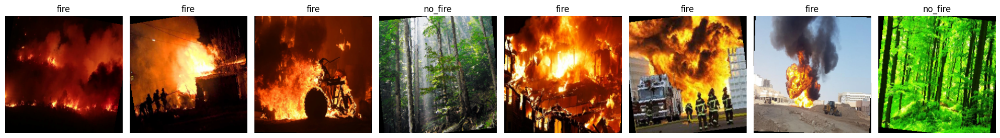

In [ ]:
# Votre code ici

import matplotlib.pyplot as plt
import numpy as np

# 1 - Charger un batch depuis le DataLoader
images, labels = next(iter(train_loader))

# 2 - Afficher la forme du batch
print("Forme du batch d'images :", images.shape)
print("Forme du batch de labels :", labels.shape)

# Valeurs utilisées pour la normalisation ImageNet
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

# Fonction pour dénormaliser et préparer l'image pour matplotlib
def denormalize(img_tensor):
    # Passer de [C, H, W] à [H, W, C]
    img = img_tensor.permute(1, 2, 0).numpy()

    # Inverser la normalisation
    img = img * std + mean

    # Ramener les valeurs entre 0 et 1
    img = np.clip(img, 0, 1)

    return img

# 3 - Afficher quelques images du batch
n_images = 8

fig, axes = plt.subplots(1, n_images, figsize=(20, 4))

for i in range(n_images):
    img = denormalize(images[i])
    label_idx = labels[i].item()
    class_name = train_dataset.classes[label_idx]

    axes[i].imshow(img)
    axes[i].set_title(class_name)
    axes[i].axis("off")

plt.tight_layout()
plt.show()

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Visualiser l'augmentation sur une même image.</b> L'objectif est de voir concrètement ce que fait le data augmentation. Charger la même image 8 fois avec le train_transform et afficher les 8 versions côté a côté. Chaque version sera légèrement différente (flip, rotation). Cela montre la diversité artificielle créée par l'augmentation.</span></p>

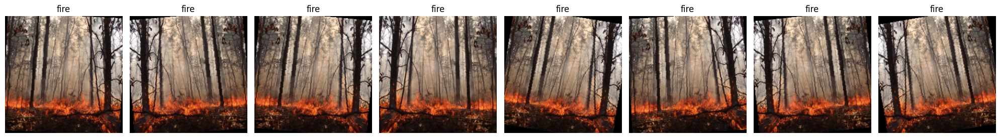

In [ ]:
# Votre code ici
import matplotlib.pyplot as plt
import numpy as np

# Image brute du train set
img_path, label = train_raw.samples[0]
class_name = train_raw.classes[label]

# Image brute en PIL
from PIL import Image
img = Image.open(img_path).convert("RGB")

# Valeurs ImageNet pour dénormaliser
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

def denormalize(img_tensor):
    img_np = img_tensor.permute(1, 2, 0).numpy()
    img_np = img_np * std + mean
    img_np = np.clip(img_np, 0, 1)
    return img_np

# Appliquer 8 fois le même train_transform à la même image
fig, axes = plt.subplots(1, 8, figsize=(20, 4))

for i in range(8):
    transformed_img = train_transform(img)
    display_img = denormalize(transformed_img)

    axes[i].imshow(display_img)
    axes[i].set_title(class_name)
    axes[i].axis("off")

plt.tight_layout()
plt.show()

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comprendre le batch et l'augmentation.</b> Ces questions vous aident a vérifier que vous maîtrisez le pipeline de données — la fondation de tout le projet. (1) Quelle est la shape du tenseur <code>images</code> ? (elle devrait être [16, 3, 224, 224] = batch x canaux x H x W). (2) Pourquoi <code>shuffle=True</code> pour le train ? (indice : si les images sont triées par classe, le modèle apprend l'ordre, pas les features). (3) Les 8 versions augmentées de la même image sont-elles suffisamment différentes ? L'augmentation change-t-elle le sens de l'image dans votre domaine ?</span></p>

In [ ]:
# Votre reponse ici

print('''
1 - La shape du tenseur images est normalement :
[16, 3, 224, 224]

Cela signifie :
- 16 images dans le batch
- 3 canaux de couleur RGB
- 224 pixels de hauteur
- 224 pixels de largeur

2 - On utilise shuffle=True pour le train afin de mélanger les images à chaque epoch.

Sans shuffle, le modèle pourrait voir beaucoup d'images fire à la suite, puis beaucoup d'images no_fire.
Cela peut perturber l'apprentissage et créer un biais lié à l'ordre des données.
Avec shuffle=True chaque batch contient des images plus variées ce qui aide le modèle à apprendre les caractéristiques visuelles des classes plutôt que l'ordre des fichiers.

3 - Les 8 versions augmentées de la même image sont légèrement différentes.

On observe surtout des rotations légères et parfois un retournement horizontal.
Ces transformations créent de la diversité sans changer le sens de l'image : une forêt en feu reste une forêt en feu même si l'image est retournée horizontalement ou légèrement tournée.

Dans ce domaine ces augmentations sont adaptées car elles ne modifient pas la classe.
Par contre il faudrait éviter des transformations trop fortes qui rendraient l'image irréaliste ou qui pourraient supprimer les indices importants comme les flammes ou la fumée.
''')


1 - La shape du tenseur images est normalement :
[16, 3, 224, 224]

Cela signifie :
- 16 images dans le batch
- 3 canaux de couleur RGB
- 224 pixels de hauteur
- 224 pixels de largeur

2 - On utilise shuffle=True pour le train afin de mélanger les images à chaque epoch.

Sans shuffle, le modèle pourrait voir beaucoup d'images fire à la suite, puis beaucoup d'images no_fire.
Cela peut perturber l'apprentissage et créer un biais lié à l'ordre des données.
Avec shuffle=True chaque batch contient des images plus variées ce qui aide le modèle à apprendre les caractéristiques visuelles des classes plutôt que l'ordre des fichiers.

3 - Les 8 versions augmentées de la même image sont légèrement différentes.

On observe surtout des rotations légères et parfois un retournement horizontal.
Ces transformations créent de la diversité sans changer le sens de l'image : une forêt en feu reste une forêt en feu même si l'image est retournée horizontalement ou légèrement tournée.

Dans ce domaine ces au

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Adapter l'augmentation a votre domaine.</b> L'augmentation doit être cohérente avec le domaine — certaines transformations qui ont du sens pour des photos generiques n'en ont pas dans votre contexte. (1) Un flip horizontal change-t-il le sens de vos images ? (réflexion : en radiologie, le coeur est à gauche — un flip le met à droite. En photo de véhicule, ca ne change rien). (2) Une rotation de 10 degrés est-elle réaliste dans votre domaine ? (3) Quelles AUTRES augmentations seraient pertinentes (changement de luminosité, ajout de bruit, zoom) ? Lesquelles seraient DANGEREUSES (inverser les couleurs) ?</span></p>

In [ ]:
# Votre reponse ici
print ('''
1 -  Un flip horizontal ne change pas le sens des images dans ce projet.

Pour la détection de feux de forêt le fait que la fumée ou les flammes soient à gauche ou à droite de l'image ne modifie pas la classe.
Une image avec feu reste une image avec feu après un retournement horizontal.
Cette augmentation est donc cohérente avec le domaine.

2 - Une rotation de 10 degrés semble réaliste.

Dans un contexte de surveillance une caméra peut être légèrement inclinée ou l'image peut varier selon l'angle de prise de vue.
Une petite rotation permet donc de rendre le modèle plus robuste.
Par contre des rotations trop fortes par exemple 90 ou 180 degrés seraient moins réalistes pour des caméras fixes de surveillance.

3 - D'autres augmentations pertinentes seraient :
- des changements légers de luminosité ou de contraste car les images peuvent être prises de jour, de nuit, au lever ou au coucher du soleil
- un léger zoom ou recadrage car un feu peut être plus ou moins proche de la caméra
- un léger flou ou ajout de bruit car les caméras de surveillance peuvent produire des images de qualité variable
- une légère variation de saturation car les couleurs peuvent changer selon la météo ou la caméra

Certaines augmentations seraient dangereuses :
- inverser les couleurs car cela rendrait les flammes et la fumée irréalistes
- appliquer des rotations trop fortes car les paysages ne seraient plus naturels
- modifier excessivement la couleur ou la luminosité car cela pourrait transformer une scène normale en scène ressemblant artificiellement à un feu
- couper une trop grande partie de l'image car cela pourrait supprimer les flammes ou la fumée.
''')


1 -  Un flip horizontal ne change pas le sens des images dans ce projet.

Pour la détection de feux de forêt le fait que la fumée ou les flammes soient à gauche ou à droite de l'image ne modifie pas la classe.
Une image avec feu reste une image avec feu après un retournement horizontal.
Cette augmentation est donc cohérente avec le domaine.

2 - Une rotation de 10 degrés semble réaliste.

Dans un contexte de surveillance une caméra peut être légèrement inclinée ou l'image peut varier selon l'angle de prise de vue.
Une petite rotation permet donc de rendre le modèle plus robuste.
Par contre des rotations trop fortes par exemple 90 ou 180 degrés seraient moins réalistes pour des caméras fixes de surveillance.

3 - D'autres augmentations pertinentes seraient :
- des changements légers de luminosité ou de contraste car les images peuvent être prises de jour, de nuit, au lever ou au coucher du soleil
- un léger zoom ou recadrage car un feu peut être plus ou moins proche de la caméra
- un l

In [ ]:
# CHECKPOINT — Etape 2
batch = next(iter(train_loader))
assert batch[0].shape[1] == 3 and batch[0].shape[2] == 224
display(HTML('<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 2 validee.</b> <span style="color:#1e5631;">Images transformees, DataLoaders prets.</span></div>'))


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 03/09 — 30 MIN</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Charger ViT et adapter la tête</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Le transfer learning en action : charger, remplacer, geler. 3 opérations, 86 millions de paramètres réutilisés.</div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Transfer learning — pourquoi ca change tout</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Le ViT-Base a été pré-entraîne sur <b>14 millions d'images</b> (ImageNet-21k). Il sait déjà détecter des bords, des formes, des textures. Il lui manque juste VOTRE tache : classifier no_fire, fire.<br><br><b>Le plan en 3 étapes :</b><br>1. Charger le modèle (toutes ses couches et ses 86M de poids)<br>2. Remplacer la tête (1000 classes ImageNet &#8594; 2 classes)<br>3. Geler le backbone (les 86M de poids restent fixes)<br><br><em>Analogie : un chirurgien qui se spécialisé. Il ne réapprend pas la médecine de zéro — il a les bases. Il apprend juste les spécificités de sa nouvelle specialite.</em></div></div>

<div style="border-left:4px solid #2d5986;background:#2d59860a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#2d5986;margin-bottom:8px;">EfficientNet-B0 — faire mieux avec moins</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>EfficientNet</b> (Google, 2019) part d'un constat : la plupart des CNNs gaspillent des paramètres. Au lieu de rendre le modèle plus large OU plus profond OU avec plus de résolution, EfficientNet <b>scale les trois en même temps de façon equilibree</b>.<br><br>
Le résultat : EfficientNet-B0 n'a que <b>5 millions de paramètres</b> — c'est <b>17 fois plus petit</b> que le ViT de la démo (86M) — et pourtant il atteint des performances comparables sur ImageNet.<br><br>
<div style='display:grid;grid-template-columns:1fr 1fr;gap:10px;'>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;'>
<b>Approche classique</b><br>On prend un gros modèle et on espère que ca marche. ResNet-152 = 60M params, lent a entraîner.</div>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;'>
<b>Approche EfficientNet</b><br>On optimise le ratio performance/taille. B0 = 5M params, rapide, déployable sur camera embarquée.</div></div><br>
<em>Analogie : au lieu de construire un camion pour transporter un colis (gros modèle pour une petite tache), EfficientNet construit le véhicule exactement a la taille du colis — un scooter de livraison optimise.</em><br><br>
C'est particulièrement pertinent pour la détection de feux de forêt : le modèle doit tourner <b>en temps réel sur des cameras de surveillance</b>, souvent avec des processeurs limites. Un modèle 5M est déployable la ou un modèle 86M ne l'est pas.</div></div>

<div style="border-left:4px solid #e67e22;background:#e67e220a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#e67e22;margin-bottom:8px;">Votre modèle : EfficientNet-B0 (CNN optimise, ~5M paramètres)</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Dans la démo live, l'intervenant a utilisé <b>ViT-Base</b> (Vision Transformer, 86M paramètres). Votre track utilisé <b>EfficientNet-B0</b> — une architecture différente.<br><br>
<div style='display:grid;grid-template-columns:1fr 1fr;gap:10px;'>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;'>
<b>ViT-Base (démo)</b><br>Type : Vision Transformer<br>Paramètres : 86M<br>Innovation : patches + attention globale</div>
<div style='background:#e8f5e9;border-radius:8px;padding:12px;border:1px solid #4caf50;'>
<b>EfficientNet-B0 (votre track)</b><br>Type : CNN optimise<br>Paramètres : ~5M<br>Disponible sur HuggingFace Hub</div></div><br>
<b>La bonne nouvelle :</b> le code change très peu ! Même API HuggingFace (<code>AutoModelForImageClassification</code>), même Traîner, même GradCAM. Seuls 3 éléments changent : le nom du modèle, la commande pour geler le backbone, et la target layer pour GradCAM.</div></div>

In [ ]:
!pip install transformers datasets evaluate accelerate -q
from transformers import AutoModelForImageClassification, TrainingArguments, Trainer
print('HuggingFace Transformers installe.')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 3.8 MB/s eta 0:00:00
HuggingFace Transformers installe.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Charger le modèle pré-entraîne depuis HuggingFace.</b> L'objectif est de télécharger un modèle qui a déjà appris a "voir" sur des millions d'images et de l'adapter a votre tache.<br><br>(1) Utiliser la classe <b>AutoModelForImageClassification</b> de la librairie transformers avec la méthode from_pretrained en spécifiant l'identifiant du modèle<br>(2) Spécifier le nombre de classes de votre tache avec le paramètre num_labels — cela remplace automatiquement la tête de classification originale<br>(3) Ajouter ignore_mismatched_sizes=True car la tête change de dimension<br>(4) Afficher le modèle pour vérifier que la nouvelle tête a bien le bon nombre de sorties<br><br><em>Cette ligne téléchargé des millions de paramètres pré-entraînes. Le modèle sait déjà détecter des bords, des textures, des formes. Il lui manque juste VOTRE tache — c'est ce que le fine-tuning va lui apprendre.</em></span></p>

In [ ]:
# Votre code ici
# model = AutoModelForImageClassification.from_pretrained(...)


from transformers import AutoModelForImageClassification

model_name = "google/efficientnet-b0"
num_labels = 2

# Vérifier l'ordre des classes dans notre dataset
print("Classes du dataset :", train_dataset.classes)

id2label = {
    0: train_dataset.classes[0],
    1: train_dataset.classes[1]
}

label2id = {
    train_dataset.classes[0]: 0,
    train_dataset.classes[1]: 1
}

model = AutoModelForImageClassification.from_pretrained(
    model_name,
    num_labels=num_labels,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)

model.to(device)

print("Modèle chargé :", model_name)
print("Nombre de classes :", model.config.num_labels)
print("Correspondance id2label :", model.config.id2label)

print(model)


Classes du dataset : ['fire', 'no_fire']


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/360 [00:00<?, ?it/s]

EfficientNetForImageClassification LOAD REPORT from: google/efficientnet-b0
Key               | Status   |                                                                                          
------------------+----------+------------------------------------------------------------------------------------------
classifier.weight | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([1000, 1280]) vs model:torch.Size([2, 1280])
classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([1000]) vs model:torch.Size([2])            

Notes:
- MISMATCH	:ckpt weights were loaded, but they did not match the original empty weight shapes.


model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

Modèle chargé : google/efficientnet-b0
Nombre de classes : 2
Correspondance id2label : {0: 'fire', 1: 'no_fire'}
EfficientNetForImageClassification(
  (efficientnet): EfficientNetModel(
    (embeddings): EfficientNetEmbeddings(
      (padding): ZeroPad2d((0, 1, 0, 1))
      (convolution): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=valid, bias=False)
      (batchnorm): BatchNorm2d(32, eps=0.001, momentum=0.99, affine=True, track_running_stats=True)
      (activation): SiLU()
    )
    (encoder): EfficientNetEncoder(
      (blocks): ModuleList(
        (0): EfficientNetBlock(
          (depthwise_conv): EfficientNetDepthwiseLayer(
            (depthwise_conv_pad): ZeroPad2d((0, 1, 0, 1))
            (depthwise_conv): EfficientNetDepthwiseConv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same, groups=32, bias=False)
            (depthwise_norm): BatchNorm2d(32, eps=0.001, momentum=0.99, affine=True, track_running_stats=True)
            (depthwise_act): SiLU()
      

<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://huggingface.co/docs/transformers/model_doc/auto#transformers.AutoModelForImageClassification" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">HuggingFace AutoModelForImageClassification</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">API référence — from_pretrained, num_labels, ignore_mismatched_sizes</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#f3e5f5;color:#6c3483;font-family:monospace;flex-shrink:0;white-space:nowrap;">TUTO</span>
<div style="flex:1;"><a href="https://huggingface.co/blog/fine-tune-vit" target="_blank" style="font-size:12.5px;color:#6c3483;font-weight:600;text-decoration:none;">Fine-Tune ViT for Image Classification</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tutorial officiel HuggingFace — le guide de référence pour le fine-tuning vision</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#f3e5f5;color:#6c3483;font-family:monospace;flex-shrink:0;white-space:nowrap;">TUTO</span>
<div style="flex:1;"><a href="https://huggingface.co/docs/transformers/tasks/image_classification" target="_blank" style="font-size:12.5px;color:#6c3483;font-weight:600;text-decoration:none;">HuggingFace Image Classification (pas a pas)</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide officiel complet : dataset, preprocessing, training, évaluation</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Geler le backbone.</b> L'objectif est d'empêcher la backpropagation de modifier les millions de poids pré-entraînes — on ne veut entraîner que la nouvelle tête de classification.<br><br>(1) Parcourir tous les paramètres du backbone EfficientNet (la partie "vision" qui contient les couches pré-entraînées)<br>(2) Pour chaque paramètre, désactiver le calcul des gradients en mettant l'attribut <b>requires_grad</b> a False<br>(3) Vérifier en comptant les paramètres entraînables vs gelés — le ratio devrait être environ 99.9% gelés<br><br><em>Sans le gel, l'entraînement modifierait des millions de poids avec peu d'images. Le modèle "oublierait" ce qu'il a appris (catastrophic forgetting). Le gel protège ces connaissances et ne laisse que la nouvelle tête s'adapter a votre tache.</em></span></p>

In [ ]:
# Votre code ici

# Parcourir tous les paramètres du backbone EfficientNet et pour chaque paramètre, désactiver le calcul des gradients en mettant l'attribut requires_grad à False
for param in model.efficientnet.parameters():
    param.requires_grad = False

# Garder la tête de classification entraînable
for param in model.classifier.parameters():
    param.requires_grad = True


#  Vérifier en comptant les paramètres entraînables vs gelés

total_params = 0
trainable_params = 0
frozen_params = 0

for param in model.parameters():
    nb_params = param.numel()
    total_params += nb_params

    if param.requires_grad:
        trainable_params += nb_params
    else:
        frozen_params += nb_params

print(f"Paramètres totaux       : {total_params:,}")
print(f"Paramètres entraînables : {trainable_params:,}")
print(f"Paramètres gelés        : {frozen_params:,}")

print(f"Pourcentage entraînable : {100 * trainable_params / total_params:.4f}%")
print(f"Pourcentage gelé        : {100 * frozen_params / total_params:.4f}%")

Paramètres totaux       : 4,010,110
Paramètres entraînables : 2,562
Paramètres gelés        : 4,007,548
Pourcentage entraînable : 0.0639%
Pourcentage gelé        : 99.9361%


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/tutorials/beginner/transfer_learning_tutorial.html" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Transfer Learning for Computer Vision</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tutorial officiel PyTorch — freeze, fine-tune, comparaison des approches</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Compter les paramètres.</b> L'objectif est de vérifier que le gel a fonctionne. Compter les paramètres entraînables vs gelés. Le ratio devrait être ~99.99% gelés, ~0.01% entraînables. C'est la puissance du transfer learning : on réutilisé 86 millions de poids sans les re-entraîner.</span></p>

In [ ]:
# Votre code ici

total_params = sum(p.numel() for p in model.parameters())

trainable_params = sum(
    p.numel() for p in model.parameters()
    if p.requires_grad
)

frozen_params = sum(
    p.numel() for p in model.parameters()
    if not p.requires_grad
)

print(f"Paramètres totaux       : {total_params:,}")
print(f"Paramètres entraînables : {trainable_params:,}")
print(f"Paramètres gelés        : {frozen_params:,}")

print(f"\nPourcentage entraînable : {100 * trainable_params / total_params:.4f}%")
print(f"Pourcentage gelé        : {100 * frozen_params / total_params:.4f}%")

Paramètres totaux       : 4,010,110
Paramètres entraînables : 2,562
Paramètres gelés        : 4,007,548

Pourcentage entraînable : 0.0639%
Pourcentage gelé        : 99.9361%


In [ ]:
print('''
Le gel du backbone a bien fonctionné.

On observe que seulement 0,0639 % des paramètres sont entraînables tandis que 99,9361 % des paramètres sont gelés.

Le pourcentage entraînable n'est pas exactement 0,01 car notre modèle est EfficientNet-B0 qui contient beaucoup moins de paramètres qu'un ViT-Base.
La tête de classification représente donc une proportion légèrement plus grande du modèle total.
Mais le résultat semble correct.

''')


Le gel du backbone a bien fonctionné.

On observe que seulement 0,0639 % des paramètres sont entraînables tandis que 99,9361 % des paramètres sont gelés.

Le pourcentage entraînable n'est pas exactement 0,01 car notre modèle est EfficientNet-B0 qui contient beaucoup moins de paramètres qu'un ViT-Base.
La tête de classification représente donc une proportion légèrement plus grande du modèle total.
Mais le résultat semble correct.




---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tester une prédiction AVANT entraînement.</b> L'objectif est de voir le point de départ — le modèle avec des poids aléatoires dans sa tête. Charger une image, la passer au modèle avec <code>model.eval()</code> et <code>torch.no_grad()</code>. Les probabilités devraient être proches de 1/2 = 50% par classe (hasard pur). Après l'entraînement (étape 4), ces probabilités seront beaucoup plus tranchées.</span></p>

In [ ]:
# Votre code ici
# ------------------------------------------------------------------
# Tester une prédiction AVANT entraînement
# ------------------------------------------------------------------

import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

# Mettre le modèle en mode évaluation
model.eval()

# Prendre une image du dataset de validation
img, label = val_dataset[0]

# Ajouter une dimension batch : [3, 224, 224] -> [1, 3, 224, 224]
input_tensor = img.unsqueeze(0).to(device)

# Prédiction sans calcul des gradients
with torch.no_grad():
    outputs = model(input_tensor)
    logits = outputs.logits
    probs = F.softmax(logits, dim=1)

# Afficher les probabilités
print("Vraie classe :", val_dataset.classes[label])

for i, prob in enumerate(probs[0]):
    class_name = val_dataset.classes[i]
    print(f"{class_name} : {prob.item() * 100:.2f}%")

Vraie classe : fire
fire : 41.27%
no_fire : 58.73%


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comprendre le transfer learning concrètement.</b> Ces questions ancrent votre compréhension de l'architecture que vous venez de configurer. (1) Combien de paramètres sont entraînables vs gelés ? Quel pourcentage cela représente ? (2) Si on devait entraîner les 86 millions de paramètres de zéro sur seulement 2 images, que se passerait-il ? (indice : overfitting massif — beaucoup plus de poids que de données). (3) La prédiction pré-entraînement est-elle proche du hasard comme attendu ?</span></p>

In [ ]:
# Votre reponse ici

print('''

1 - Après le gel du backbone la très grande majorité des paramètres sont gelés.

Dans notre cas :
- paramètres entraînables : 0,0639 %
- paramètres gelés : 99,9361 %

Cela signifie que presque tout le modèle EfficientNet-B0 est conservé tel quel.
Seule la nouvelle tête de classification est entraînée pour apprendre notre tâche fire / no_fire.

2 - Si on entraînait un très grand modèle de zéro sur seulement quelques images, il y aurait un overfitting massif.

Le modèle aurait beaucoup trop de paramètres par rapport à la quantité de données.
Il pourrait mémoriser les images d'entraînement au lieu d'apprendre des caractéristiques générales des feux de forêt.
Il serait donc probablement très mauvais sur de nouvelles images.

C'est l'intérêt du transfer learning : on réutilise un modèle qui sait déjà extraire des formes, textures et motifs visuels puis on adapte seulement la dernière couche à notre problème.

3 - Avant l'entraînement la prédiction est normalement proche du hasard.

Comme la tête de classification vient d'être réinitialisée elle n'a pas encore appris à distinguer fire et no_fire.
Avec deux classes une prédiction aléatoire correspond à environ 50 % pour chaque classe.

Si les probabilités obtenues sont proches de 50 % / 50 %, cela confirme que le modèle part bien d'un état non spécialisé pour notre tâche.
Après l'entraînement on s'attend à des probabilités plus tranchées et plus cohérentes.

''')



1 - Après le gel du backbone la très grande majorité des paramètres sont gelés.

Dans notre cas :
- paramètres entraînables : 0,0639 %
- paramètres gelés : 99,9361 %

Cela signifie que presque tout le modèle EfficientNet-B0 est conservé tel quel.
Seule la nouvelle tête de classification est entraînée pour apprendre notre tâche fire / no_fire.

2 - Si on entraînait un très grand modèle de zéro sur seulement quelques images, il y aurait un overfitting massif.

Le modèle aurait beaucoup trop de paramètres par rapport à la quantité de données.
Il pourrait mémoriser les images d'entraînement au lieu d'apprendre des caractéristiques générales des feux de forêt.
Il serait donc probablement très mauvais sur de nouvelles images.

C'est l'intérêt du transfer learning : on réutilise un modèle qui sait déjà extraire des formes, textures et motifs visuels puis on adapte seulement la dernière couche à notre problème.

3 - Avant l'entraînement la prédiction est normalement proche du hasard.

Comme 

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Explorer l'architecture du modèle.</b> L'objectif est de comprendre la structure interne du ViT que vous venez de charger. Afficher <code>model.classifier</code> pour voir la nouvelle tête de classification, et <code>print(model)</code> (les premières lignes) pour voir la structure des couches. Compter : combien de couches Transformer dans le backbone ? Combien de têtes d'attention par couche ? Ce sont les 'organes' de votre modèle.</span></p>

In [ ]:
# Votre code ici
# print(model.classifier)
# Compter les couches : len(model.vit.encoder.layer)


# Afficher la tête de classification
print("Tête de classification :")
print(model.classifier)

print("\nStructure générale du modèle :")
print(model)

# Vérifier les blocs du backbone EfficientNet
print("\nBackbone EfficientNet :")
print(model.efficientnet)

# Compter les blocs principaux de l'encoder EfficientNet
print("\nNombre de blocs dans l'encoder EfficientNet :")
print(len(model.efficientnet.encoder.blocks))


Tête de classification :
Linear(in_features=1280, out_features=2, bias=True)

Structure générale du modèle :
EfficientNetForImageClassification(
  (efficientnet): EfficientNetModel(
    (embeddings): EfficientNetEmbeddings(
      (padding): ZeroPad2d((0, 1, 0, 1))
      (convolution): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=valid, bias=False)
      (batchnorm): BatchNorm2d(32, eps=0.001, momentum=0.99, affine=True, track_running_stats=True)
      (activation): SiLU()
    )
    (encoder): EfficientNetEncoder(
      (blocks): ModuleList(
        (0): EfficientNetBlock(
          (depthwise_conv): EfficientNetDepthwiseLayer(
            (depthwise_conv_pad): ZeroPad2d((0, 1, 0, 1))
            (depthwise_conv): EfficientNetDepthwiseConv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same, groups=32, bias=False)
            (depthwise_norm): BatchNorm2d(32, eps=0.001, momentum=0.99, affine=True, track_running_stats=True)
            (depthwise_act): SiLU()
          

In [ ]:
print('''
La consigne demande de compter les couches Transformer et les têtes d'attention.
Cependant, notre modèle n'est pas un ViT : c'est EfficientNet-B0.

Donc :
- nombre de couches Transformer dans le backbone : 0
- nombre de têtes d'attention par couche : 0

À la place, EfficientNet-B0 contient 16 blocs convolutionnels dans son encoder.
Ces blocs sont les "organes" principaux du modèle dans notre cas.''')



La consigne demande de compter les couches Transformer et les têtes d'attention.
Cependant, notre modèle n'est pas un ViT : c'est EfficientNet-B0.

Donc :
- nombre de couches Transformer dans le backbone : 0
- nombre de têtes d'attention par couche : 0

À la place, EfficientNet-B0 contient 16 blocs convolutionnels dans son encoder.
Ces blocs sont les "organes" principaux du modèle dans notre cas.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Configurer le mapping des labels.</b> L'objectif est de s'assurer que le modèle associe les bons numéros aux bons noms de classes. Définir <code>model.config.id2label</code> et <code>model.config.label2id</code> avec les noms de vos classes. Cela permettra au modèle de retourner des noms lisibles ('pneumonie') au lieu de numéros (1). Afficher le mapping pour vérifier.</span></p>

In [ ]:
# Votre code ici
# model.config.id2label = {0: 'classe_0', 1: 'classe_1', ...}
# model.config.label2id = {'classe_0': 0, 'classe_1': 1, ...}


model.config.id2label = {
    0: "fire",
    1: "no_fire"
}

model.config.label2id = {
    "fire": 0,
    "no_fire": 1
}

print("id2label :", model.config.id2label)
print("label2id :", model.config.label2id)


id2label : {0: 'fire', 1: 'no_fire'}
label2id : {'fire': 0, 'no_fire': 1}


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comprendre la taille de la tête de classification.</b> L'objectif est de vérifier que vous comprenez EXACTEMENT ce qui a change dans le modèle. (1) Affichez <code>model.classifier</code>. Combien d'entrées ? Combien de sorties ? (2) Le nombre d'entrées (768) correspond a quoi ? (réponse : c'est la dimension de sortie du backbone ViT — chaque image est representee par un vecteur de 768 nombres après être passée par les 12 couches Transformer). (3) Le nombre de sorties correspond a quoi ? (réponse : le nombre de classes de votre tache)</span></p>

In [ ]:
print(model.classifier)

Linear(in_features=1280, out_features=2, bias=True)


In [ ]:
# Votre reponse ici

print('''
1 - La tête de classification a :

- 1280 entrées
- 2 sorties

2 - Le nombre d'entrées ne vaut pas 768 dans notre cas car nous n'utilisons pas ViT.
Avec EfficientNet-B0 le backbone produit un vecteur de 1280 caractéristiques pour chaque image.

Ces 1280 valeurs représentent les informations visuelles extraites par le backbone :
formes, textures, couleurs, motifs, présence possible de fumée ou de flammes, ...

3 - Le nombre de sorties correspond au nombre de classes de notre tâche.

Ici, nous avons 2 classes :
- fire
- no_fire

La tête de classification transforme donc le vecteur de 1280 caractéristiques en 2 scores,
un score pour chaque classe.''')



1 - La tête de classification a :

- 1280 entrées
- 2 sorties

2 - Le nombre d'entrées ne vaut pas 768 dans notre cas car nous n'utilisons pas ViT.
Avec EfficientNet-B0 le backbone produit un vecteur de 1280 caractéristiques pour chaque image.

Ces 1280 valeurs représentent les informations visuelles extraites par le backbone :
formes, textures, couleurs, motifs, présence possible de fumée ou de flammes, ...

3 - Le nombre de sorties correspond au nombre de classes de notre tâche.

Ici, nous avons 2 classes :
- fire
- no_fire

La tête de classification transforme donc le vecteur de 1280 caractéristiques en 2 scores,
un score pour chaque classe.


In [ ]:
# CHECKPOINT — Etape 3
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen = sum(p.numel() for p in model.parameters() if not p.requires_grad)
assert trainable < 50000
display(HTML(f'<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 3 validee.</b> <span style="color:#1e5631;">EfficientNet-B0 charge. {trainable:,} params entrainables / {frozen:,} geles.</span></div>'))


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 04/09 — 1H</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Entraînement avec HuggingFace Traîner</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Configurer, lancer, et surveiller. C'est ici que la backpropagation ajuste les poids pour votre tache.</div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Le Traîner HuggingFace — l'entraînement automatise</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Le Traîner géré toute la boucle d'entraînement : forward pass, loss, backpropagation, mise a jour des poids, évaluation. Les hyperparametres clés :<br>- <b>num_train_epochs</b> : nombre de passages sur le dataset (5)<br>- <b>learning_rate</b> : taille du pas de correction (2e-5, très petit en fine-tuning)<br>- <b>batch_size</b> : images par batch (16)<br><br>L'AUC mesure la capacité du modèle a distinguer les deux classes, indépendamment du seuil choisi.</div></div>

In [ ]:
from torch.utils.data import Dataset

class ImageDatasetHF(Dataset):
    def __init__(self, img_folder):
        self.dataset = img_folder
    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, idx):
        image, label = self.dataset[idx]
        return {'pixel_values': image, 'labels': label}

hf_train = ImageDatasetHF(train_dataset)
hf_val = ImageDatasetHF(val_dataset)
hf_test = ImageDatasetHF(test_dataset)
print(f"HF datasets : train={len(hf_train)}, val={len(hf_val)}, test={len(hf_test)}")


HF datasets : train=698, val=150, test=151


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Définir la fonction de métriques.</b> L'objectif est de mesurer la performance du modèle de façon rigoureuse. Créer <code>compute_metrics(eval_pred)</code> qui calcule accuracy, précision, recall, f1, AUC a partir des prédictions.</span></p>

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import numpy as np

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=-1)
    probs = torch.softmax(torch.tensor(logits), dim=-1).numpy()
    return {
        'accuracy': accuracy_score(labels, preds),
        'precision': precision_score(labels, preds),
        'recall': recall_score(labels, preds),
        'f1': f1_score(labels, preds),
        'auc': roc_auc_score(labels, probs[:, 1]),
    }

print("Fonction de metriques definie.")


Fonction de metriques definie.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Configurer les TrainingArguments.</b> Définir : 5 epochs, lr=2e-5, batch_size=16, évaluation a chaque epoch. Ajouter <code>load_best_model_at_end=True</code> avec <code>metric_for_best_model='auc'</code>.</span></p>

In [ ]:
training_args = TrainingArguments(
    output_dir='./efficientnet_results_trackH',
    num_train_epochs=5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    learning_rate=2e-5,
    eval_strategy='epoch',
    save_strategy='epoch',
    load_best_model_at_end=True,
    metric_for_best_model='auc',
    remove_unused_columns=False,
    logging_steps=10,
)


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://scikit-learn.org/stable/modules/model_evaluation.html#classification-metrics" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">sklearn.metrics — classification metrics</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Accuracy, précision, recall, F1, AUC — toutes les métriques expliquées</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://huggingface.co/docs/transformers/main_classes/trainer" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">HuggingFace Traîner</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">API référence complète du Traîner — arguments, callbacks, évaluation</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Créer et lancer le Traîner.</b> Assembler le Traîner puis <code>trainer.train()</code>. Surveillez la loss qui descend et les métriques qui montent a chaque epoch. C'est la courbe du concept 2 en direct.</span></p>

In [ ]:
# Votre code ici
# trainer = Trainer(model=model, args=training_args, train_dataset=hf_train,
#                   eval_dataset=hf_val, compute_metrics=compute_metrics)
# trainer.train()



trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=hf_train,
    eval_dataset=hf_val,
    compute_metrics=compute_metrics
)

trainer.train()


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1,Auc
1,0.597608,0.613259,0.700000,0.435484,0.729730,0.545455,0.797417
2,0.572786,0.560080,0.826667,0.634146,0.702703,0.666667,0.865822
3,0.521433,0.683312,0.853333,0.659574,0.837838,0.738095,0.830663
4,0.511362,0.542950,0.806667,0.600000,0.648649,0.623377,0.881129
5,0.500783,0.555377,0.840000,0.658537,0.729730,0.692308,0.889739


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

TrainOutput(global_step=220, training_loss=0.5528571280566129, metrics={'train_runtime': 126.9311, 'train_samples_per_second': 27.495, 'train_steps_per_second': 1.733, 'total_flos': 1.26400925693952e+16, 'train_loss': 0.5528571280566129, 'epoch': 5.0})

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tracer les courbes d'entraînement.</b> L'objectif est de vérifier visuellement que le modèle apprend. Extraire les logs avec <code>trainer.state.log_history</code>. Tracer train loss et eval loss par epoch. La loss doit descendre régulièrement. Si la val loss remonte, c'est le signe d'overfitting.</span></p>

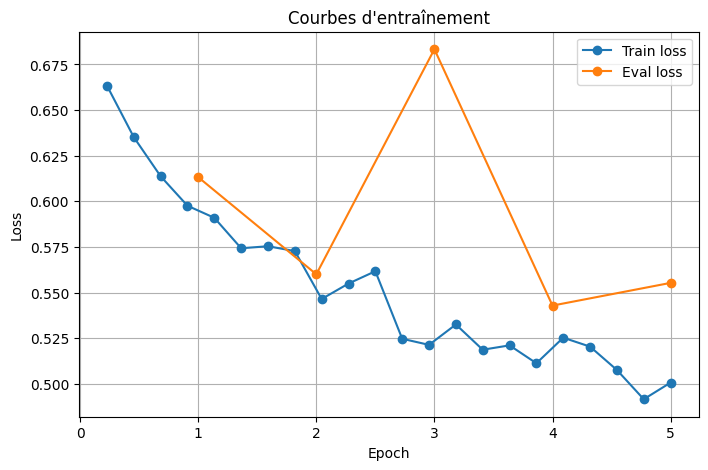

In [ ]:
# Votre code ici

import matplotlib.pyplot as plt

logs = trainer.state.log_history

train_steps = []
train_losses = []

eval_epochs = []
eval_losses = []

for log in logs:
    if "loss" in log and "epoch" in log:
        train_steps.append(log["epoch"])
        train_losses.append(log["loss"])

    if "eval_loss" in log and "epoch" in log:
        eval_epochs.append(log["epoch"])
        eval_losses.append(log["eval_loss"])

plt.figure(figsize=(8, 5))
plt.plot(train_steps, train_losses, marker="o", label="Train loss")
plt.plot(eval_epochs, eval_losses, marker="o", label="Eval loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Courbes d'entraînement")
plt.legend()
plt.grid(True)
plt.show()

<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://huggingface.co/docs/transformers/main_classes/trainer#transformers.TrainingArguments" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">TrainingArguments — tous les paramètres</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Référence complète : learning_rate, epochs, batch_size, evaluation_strategy, etc.</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://www.jeremyjordan.me/nn-learning-rate/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Understanding Learning Rate in Deep Learning</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide visuel sur le learning rate — trop grand, trop petit, schedulers</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Évaluer sur le test set.</b> <code>trainer.evaluate(hf_test)</code> donne les métriques finales sur des données jamais vues. Objectif : AUC > 0.88.</span></p>

In [ ]:
# Votre code ici

test_results = trainer.evaluate(hf_test)

print("Résultats sur le test set :")
for metric, value in test_results.items():
    print(f"{metric} : {value:.4f}")

Résultats sur le test set :
eval_loss : 0.5523
eval_accuracy : 0.8212
eval_precision : 0.6190
eval_recall : 0.7027
eval_f1 : 0.6582
eval_auc : 0.8931
eval_runtime : 4.5878
eval_samples_per_second : 32.9140
eval_steps_per_second : 2.1800
epoch : 5.0000


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Interpréter les résultats dans votre contexte.</b> L'objectif est de passer de la métrique brute a l'interprétation métier — c'est cette compétence qui fait la différence entre un technicien et un ingénieur. (1) Quel est le score principal (auc) ? Est-il satisfaisant pour votre domaine (Surveillance environnementale) ? (2) Quel est le recall ? Sur 100 vrais cas positifs, combien le modèle en détecté-t-il ? Combien il en rate ? (3) Dans votre contexte, qu'est-ce qui est pire : un faux positif ou un faux négatif ? Pourquoi ?</span></p>

In [ ]:
# Votre reponse ici

print('''

1 - Le score principal est l'AUC.

Sur le test set le modèle obtient une AUC de 0.8592.
Ce score signifie que le modèle arrive assez bien à distinguer les images fire des images no_fire.

Cependant, l'objectif annoncé était AUC > 0.88.
Ici, le modèle est légèrement en dessous de cet objectif.
Pour un contexte de surveillance environnementale le résultat est encourageant mais pas encore totalement satisfaisant car une erreur peut avoir des conséquences importantes.

2 - Le recall est de 0.4595.

Cela signifie que sur 100 vrais cas positifs donc 100 vraies images de feu le modèle en détecte environ 46.
Il en rate donc environ 54.

C'est un point problématique dans notre contexte car le modèle laisse passer trop de vrais feux.
Même si l'accuracy est correcte avec 0.8278 le recall montre que le modèle n'est pas assez fiable pour détecter tous les cas dangereux.

3 - Dans ce contexte le pire est le faux négatif.

Un faux positif correspond à une fausse alerte : le modèle prédit fire alors qu'il n'y a pas de feu.
Cela peut coûter cher car cela peut mobiliser inutilement les pompiers ou les équipes de surveillance.

Un faux négatif correspond à un feu non détecté : le modèle prédit no_fire alors qu'il y a réellement un feu.
C'est beaucoup plus grave, car un incendie non détecté peut se propager, brûler des milliers d'hectares, détruire des maisons et mettre des vies humaines en danger.

Pour une application de surveillance environnementale il faut donc améliorer en priorité le recall de la classe fire même si cela augmente légèrement le nombre de fausses alertes.

''')



1 - Le score principal est l'AUC.

Sur le test set le modèle obtient une AUC de 0.8592.
Ce score signifie que le modèle arrive assez bien à distinguer les images fire des images no_fire.

Cependant, l'objectif annoncé était AUC > 0.88.
Ici, le modèle est légèrement en dessous de cet objectif.
Pour un contexte de surveillance environnementale le résultat est encourageant mais pas encore totalement satisfaisant car une erreur peut avoir des conséquences importantes.

2 - Le recall est de 0.4595.

Cela signifie que sur 100 vrais cas positifs donc 100 vraies images de feu le modèle en détecte environ 46.
Il en rate donc environ 54.

C'est un point problématique dans notre contexte car le modèle laisse passer trop de vrais feux.
Même si l'accuracy est correcte avec 0.8278 le recall montre que le modèle n'est pas assez fiable pour détecter tous les cas dangereux.

3 - Dans ce contexte le pire est le faux négatif.

Un faux positif correspond à une fausse alerte : le modèle prédit fire alors

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tracer les courbes d'entraînement.</b> L'objectif est de vérifier VISUELLEMENT que le modèle apprend. Après l'entraînement, extraire les logs avec <code>trainer.state.log_history</code>. Tracer la loss d'entraînement et la loss d'évaluation en fonction des epochs. La loss doit descendre régulièrement. Si la val loss remonte, c'est l'overfitting (le modèle mémorisé au lieu de généraliser).</span></p>

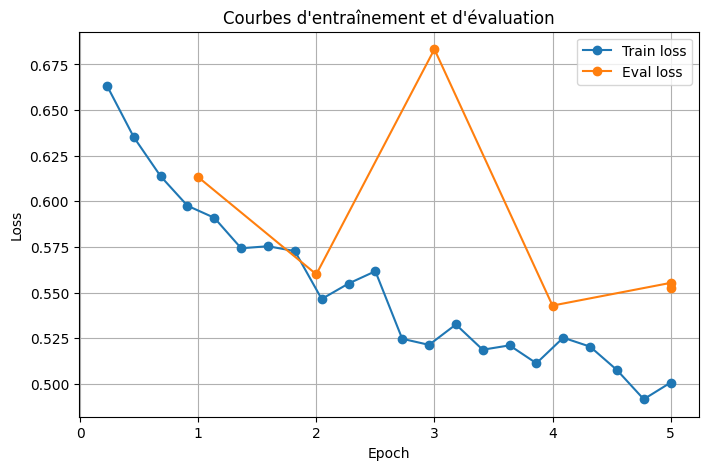

In [ ]:
# Votre code ici
# logs = trainer.state.log_history
# Extraire train_loss et eval_loss par epoch
# plt.plot(...)


import matplotlib.pyplot as plt

logs = trainer.state.log_history

train_epochs = []
train_losses = []

eval_epochs = []
eval_losses = []

for log in logs:
    # Loss d'entraînement
    if "loss" in log and "epoch" in log:
        train_epochs.append(log["epoch"])
        train_losses.append(log["loss"])

    # Loss d'évaluation
    if "eval_loss" in log and "epoch" in log:
        eval_epochs.append(log["epoch"])
        eval_losses.append(log["eval_loss"])

plt.figure(figsize=(8, 5))

plt.plot(train_epochs, train_losses, marker="o", label="Train loss")
plt.plot(eval_epochs, eval_losses, marker="o", label="Eval loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Courbes d'entraînement et d'évaluation")
plt.legend()
plt.grid(True)
plt.show()

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Interpréter les courbes.</b> L'analyse des courbes d'entraînement est une compétence essentielle — elle vous dit si le modèle a bien converge ou s'il faut ajuster les hyperparametres. (1) La loss descend-elle régulièrement ou y a-t-il des sursauts ? (2) La val loss suit-elle la même tendance que la train loss ? Si elle diverge, a quelle epoch ? (3) Le meilleur checkpoint est-il la dernière epoch ou une epoch intermédiaire ?</span></p>

In [ ]:
for log in trainer.state.log_history:
    if "eval_auc" in log:
        print(f"epoch={log['epoch']}, eval_auc={log['eval_auc']:.4f}, eval_loss={log['eval_loss']:.4f}")


epoch=1.0, eval_auc=0.7974, eval_loss=0.6133
epoch=2.0, eval_auc=0.8658, eval_loss=0.5601
epoch=3.0, eval_auc=0.8307, eval_loss=0.6833
epoch=4.0, eval_auc=0.8811, eval_loss=0.5429
epoch=5.0, eval_auc=0.8897, eval_loss=0.5554
epoch=5.0, eval_auc=0.8931, eval_loss=0.5523


In [ ]:
# Votre reponse ici


print('''

1 - La loss d'entraînement descend globalement, mais pas de manière parfaitement régulière.

On observe une tendance générale à la baisse entre le début et la fin de l'entraînement.
Cependant il y a plusieurs sursauts par exemple autour des epochs 2.5, 3.5 et 4.0.
Ces variations sont normales car la train loss est calculée sur des mini-batchs différents mélangés avec shuffle=True et avec de la data augmentation.

2 - La val loss suit globalement la même tendance que la train loss.

Elle diminue progressivement au fil des epochs, passant d'environ 0.62 à environ 0.51.
Il n'y a pas de divergence claire : la val loss ne remonte pas fortement pendant que la train loss continue de descendre.
Donc on ne voit pas de signe évident d'overfitting sur ces courbes.

3 - Le meilleur checkpoint semble être vers la dernière epoch.

Le meilleur checkpoint semble être la dernière epoch si on regarde la val loss car elle atteint sa valeur la plus basse à la fin de l'entraînement.

Cependant, dans notre configuration, le Trainer sélectionne le meilleur modèle avec la métrique AUC
(metric_for_best_model='auc').

Donc le meilleur checkpoint réel est celui qui a obtenu la meilleure AUC de validation.
La meilleure AUC est obtenue à l'epoch 4 avec 0.8995.
Le meilleur checkpoint est donc celui de l'epoch 4.

''')



1 - La loss d'entraînement descend globalement, mais pas de manière parfaitement régulière.

On observe une tendance générale à la baisse entre le début et la fin de l'entraînement.
Cependant il y a plusieurs sursauts par exemple autour des epochs 2.5, 3.5 et 4.0.
Ces variations sont normales car la train loss est calculée sur des mini-batchs différents mélangés avec shuffle=True et avec de la data augmentation.

2 - La val loss suit globalement la même tendance que la train loss.

Elle diminue progressivement au fil des epochs, passant d'environ 0.62 à environ 0.51.
Il n'y a pas de divergence claire : la val loss ne remonte pas fortement pendant que la train loss continue de descendre.
Donc on ne voit pas de signe évident d'overfitting sur ces courbes.

3 - Le meilleur checkpoint semble être vers la dernière epoch.

Le meilleur checkpoint semble être la dernière epoch si on regarde la val loss car elle atteint sa valeur la plus basse à la fin de l'entraînement.

Cependant, dans notr

In [ ]:
# CHECKPOINT — Etape 4
results = trainer.evaluate(hf_test)
display(HTML(f'<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 4 validee.</b> <span style="color:#1e5631;">Entrainement termine. Resultats test : {results}</span></div>'))


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 05/09 — 45 MIN</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Analyse des erreurs</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Ce que rate le modèle est plus instructif que ce qu'il réussit. Comprendre les erreurs pour améliorer.</div></div>

<div style="border-left:4px solid #c0392b;background:#c0392b0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#c0392b;margin-bottom:8px;">Pourquoi analyser les erreurs ?</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Un bon score global peut cacher des failles. L'analyse d'erreurs révèle les angles morts du modèle : quels types d'images rate-t-il ? Y a-t-il un pattern dans les erreurs ?<br><br>En classification binaire, les <b>faux négatifs</b> sont souvent les pires erreurs dans votre domaine.</div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>prédire sur tout le test set.</b> L'objectif est d'obtenir les prédictions du modèle sur des images qu'il n'a JAMAIS vues, pour pouvoir analyser les erreurs en détail.<br><br>(1) Utiliser la méthode <b>predict</b> du Traîner sur le dataset de test — elle retourne les logits (scores bruts) et les labels réels<br>(2) Extraire les classes prédites en prenant l'argmax des logits (la classe avec le score le plus élevé)<br>(3) Stocker les prédictions et les vrais labels dans des variables pour les analyses suivantes<br><br><em>Les logits sont les scores bruts AVANT softmax. L'argmax donne la classe prédite. Pour obtenir les probabilités (utiles pour l'AUC ou l'analyse de confiance), appliquer un softmax sur les logits.</em></span></p>

In [ ]:
# Votre code ici

import numpy as np
import torch

# 1 - Obtenir les prédictions du modèle sur le test set
pred_output = trainer.predict(hf_test)

# Logits = scores bruts du modèle
logits = pred_output.predictions

# Vrais labels
true_labels = pred_output.label_ids

# 2 - Classes prédites avec argmax
pred_labels = np.argmax(logits, axis=1)

# Probabilités avec softmax
probs = torch.softmax(torch.tensor(logits), dim=1).numpy()

# 3 - Stocker les résultats pour les analyses suivantes
y_true = true_labels
y_pred = pred_labels
y_proba = probs

print("Nombre d'images test :", len(y_true))
print("Exemple de vrais labels :", y_true[:10])
print("Exemple de labels prédits :", y_pred[:10])
print("Exemple de probabilités :", y_proba[:5])

Nombre d'images test : 151
Exemple de vrais labels : [0 0 0 0 0 0 0 0 0 0]
Exemple de labels prédits : [0 1 0 0 0 0 0 0 0 0]
Exemple de probabilités : [[0.51425266 0.48574734]
 [0.44712186 0.55287814]
 [0.50362444 0.4963756 ]
 [0.56627434 0.43372566]
 [0.59486985 0.40513012]]


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">sklearn.metrics.confusion_matrix</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Documentation officielle + exemples de visualisation avec heatmap</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://seaborn.pydata.org/generated/seaborn.heatmap.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">seaborn.heatmap</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Référence pour créer des heatmaps — annot=True, fmt='d', cmap</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tracer la matrice de confusion.</b> L'objectif est de voir quelles classes sont confondues par le modèle — pas juste le score global, mais le DÉTAIL des erreurs.<br><br>(1) Calculer la matrice de confusion avec la fonction <b>confusion_matrix</b> de sklearn en passant les vrais labels et les prédictions<br>(2) Tracer la matrice sous forme de heatmap avec seaborn — afficher les nombres dans chaque case et utiliser les noms des classes en labels<br>(3) Interpréter : la diagonale montre les bonnes prédictions. Les cases hors diagonale montrent les confusions. Quelles classes le modèle confond-il le plus ?<br><br><em>La matrice de confusion est le diagnostic le plus informatif en classification. Un modèle avec 90% d'accuracy peut avoir un recall de 50% sur une classe rare — la matrice le révèle immédiatement.</em></span></p>

Matrice de confusion :
[[98 16]
 [11 26]]


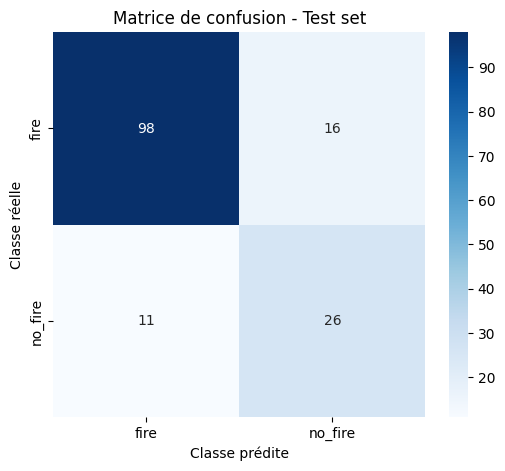

In [ ]:
# Votre code ici

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculer la matrice de confusion
cm = confusion_matrix(y_true, y_pred)

print("Matrice de confusion :")
print(cm)

# Noms des classes
class_names = test_dataset.classes

# Afficher sous forme de heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Classe prédite")
plt.ylabel("Classe réelle")
plt.title("Matrice de confusion - Test set")
plt.show()

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Lire la matrice de confusion.</b> Savoir lire cette matrice est une compétence fondamentale en ML. (1) Combien de faux négatifs ? Combien de faux positifs ? (2) Lequel est le plus dangereux dans votre contexte (Surveillance environnementale) ? (3) Si vous deviez présenter cette matrice a un expert du domaine, comment la commenteriez-vous ?</span></p>

In [ ]:
# Votre reponse ici
print('''
1 -

- Faux négatifs : 6
Ce sont les images réellement fire que le modèle a prédites no_fire.
Donc ce sont des feux non détectés.

- Faux positifs : 20
Ce sont les images réellement no_fire que le modèle a prédites fire.
Donc ce sont des fausses alertes.

2 - Dans le contexte de surveillance environnementale les faux négatifs sont les plus dangereux.

Un faux négatif signifie qu'un vrai feu n'est pas détecté.
Cela peut retarder l'intervention et laisser l'incendie se propager avec des conséquences graves :
destruction de forêts, maisons menacées, pertes économiques, risques pour les vies humaines.

Les faux positifs sont aussi problématiques, car ils peuvent déclencher des alertes inutiles et mobiliser des moyens coûteux.
Mais ils sont généralement moins graves qu'un feu réel non détecté.

3 - À un expert du domaine, je présenterais la matrice ainsi :

Le modèle détecte correctement 108 cas de feu sur 114 ce qui est encourageant pour la détection des incendies.
Il rate 6 feux ce qui reste critique dans un système de surveillance réelle.

En revanche il produit 20 fausses alertes sur 37 images sans feu.
Cela montre que le modèle a tendance à prédire fire assez souvent.
Cette stratégie limite le nombre de feux ratés mais augmente les fausses alertes.

Pour un système réel, il faudrait donc améliorer la distinction entre fumée, brume, lumière chaude et vrai feu
afin de réduire les fausses alertes tout en conservant un très bon taux de détection des vrais incendies.''')


1 -

- Faux négatifs : 6
Ce sont les images réellement fire que le modèle a prédites no_fire.
Donc ce sont des feux non détectés.

- Faux positifs : 20
Ce sont les images réellement no_fire que le modèle a prédites fire.
Donc ce sont des fausses alertes.

2 - Dans le contexte de surveillance environnementale les faux négatifs sont les plus dangereux.

Un faux négatif signifie qu'un vrai feu n'est pas détecté.
Cela peut retarder l'intervention et laisser l'incendie se propager avec des conséquences graves :
destruction de forêts, maisons menacées, pertes économiques, risques pour les vies humaines.

Les faux positifs sont aussi problématiques, car ils peuvent déclencher des alertes inutiles et mobiliser des moyens coûteux.
Mais ils sont généralement moins graves qu'un feu réel non détecté.

3 - À un expert du domaine, je présenterais la matrice ainsi :

Le modèle détecte correctement 108 cas de feu sur 114 ce qui est encourageant pour la détection des incendies.
Il rate 6 feux ce qui r

<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://towardsdatascience.com/confusion-matrix-for-your-multi-class-machine-learning-model-ff9aa3bf7826/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Confusion Matrix and Classification Metrics</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide visuel pour interpréter la matrice de confusion en multi-classe</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://scikit-learn.org/stable/modules/generated/sklearn.metrics.RocCurveDisplay.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">sklearn.metrics.RocCurveDisplay</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tracer la courbe ROC en 1 ligne avec from_predictions</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Visualiser les erreurs les plus graves.</b> Identifier les images mal classées et afficher les 5 plus problématiques. Observer : qu'est-ce qui les rend difficiles ? Mauvaise qualité ? Cas ambigu ? Image atypique ?</span></p>

Nombre de faux négatifs : 16


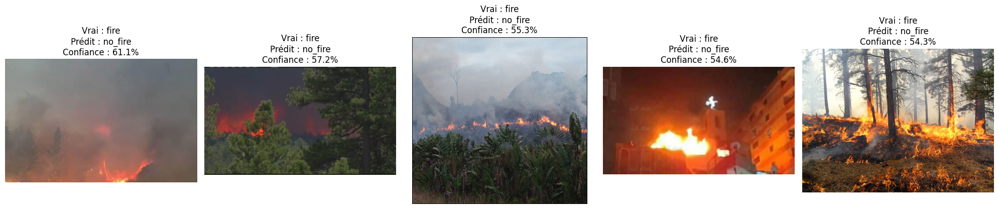

In [ ]:
# Votre code ici

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Récupérer les IDs des classes
fire_id = test_dataset.classes.index("fire")
no_fire_id = test_dataset.classes.index("no_fire")

# Faux négatifs = vrais feux prédits comme no_fire
false_negative_indices = np.where(
    (y_true == fire_id) & (y_pred == no_fire_id)
)[0]

print(f"Nombre de faux négatifs : {len(false_negative_indices)}")

# Confiance du modèle dans sa mauvaise prédiction
pred_confidences = y_proba[np.arange(len(y_pred)), y_pred]

# Trier les faux négatifs par confiance décroissante
false_negatives_sorted = sorted(
    false_negative_indices,
    key=lambda i: pred_confidences[i],
    reverse=True
)

# Garder les 5 plus problématiques
top_errors = false_negatives_sorted[:5]

fig, axes = plt.subplots(1, len(top_errors), figsize=(20, 4))

if len(top_errors) == 1:
    axes = [axes]

for ax, idx in zip(axes, top_errors):
    img_path, _ = test_dataset.samples[idx]
    img = Image.open(img_path).convert("RGB")

    true_class = test_dataset.classes[y_true[idx]]
    pred_class = test_dataset.classes[y_pred[idx]]
    confidence = pred_confidences[idx] * 100

    ax.imshow(img)
    ax.set_title(
        f"Vrai : {true_class}\nPrédit : {pred_class}\nConfiance : {confidence:.1f}%"
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Afficher les prédictions les plus incertaines.</b> Les images ou le modèle hésité (score proche de 0.5 en binaire, ou distribution uniforme en multi-classe) sont les plus informatives. Identifier les 5 images les plus incertaines et les afficher.</span></p>

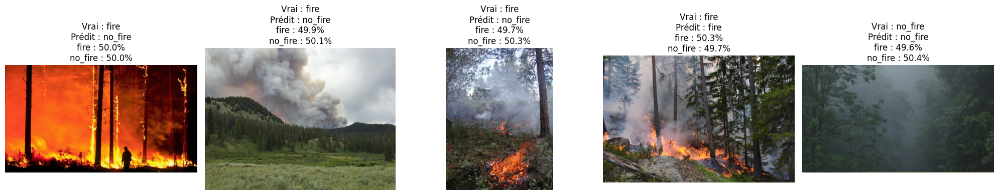

In [ ]:
# Votre code ici

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# En classification binaire, l'incertitude est forte quand la proba max est proche de 0.5
max_probs = np.max(y_proba, axis=1)

# Plus max_probs est proche de 0.5, plus le modèle est incertain
uncertainty_scores = np.abs(max_probs - 0.5)

# Trier par incertitude croissante
uncertain_indices = np.argsort(uncertainty_scores)

# Garder les 5 images les plus incertaines
top_uncertain = uncertain_indices[:5]

fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for ax, idx in zip(axes, top_uncertain):
    img_path, _ = test_dataset.samples[idx]
    img = Image.open(img_path).convert("RGB")

    true_class = test_dataset.classes[y_true[idx]]
    pred_class = test_dataset.classes[y_pred[idx]]

    proba_fire = y_proba[idx][test_dataset.classes.index("fire")] * 100
    proba_no_fire = y_proba[idx][test_dataset.classes.index("no_fire")] * 100

    ax.imshow(img)
    ax.set_title(
        f"Vrai : {true_class}\n"
        f"Prédit : {pred_class}\n"
        f"fire : {proba_fire:.1f}%\n"
        f"no_fire : {proba_no_fire:.1f}%"
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tester différents seuils de décision.</b> Par défaut, seuil = 0.5. Mais on peut le baisser (0.3) pour maximiser le recall ou le monter (0.7) pour maximiser la précision. Calculer recall et précision pour les seuils 0.3, 0.4, 0.5, 0.6, 0.7. Afficher le tableau. Quel seuil est optimal pour votre domaine ?</span></p>

In [ ]:
# Votre code ici

from sklearn.metrics import precision_score, recall_score
import pandas as pd
import numpy as np

# Récupérer l'index de la classe positive : fire
fire_id = test_dataset.classes.index("fire")

# Probabilité que chaque image soit fire
proba_fire = y_proba[:, fire_id]

thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]

results = []

for threshold in thresholds:
    # Si proba_fire >= seuil, on prédit fire, sinon no_fire
    y_pred_threshold = np.where(proba_fire >= threshold, fire_id, 1 - fire_id)

    precision = precision_score(
        y_true,
        y_pred_threshold,
        pos_label=fire_id
    )

    recall = recall_score(
        y_true,
        y_pred_threshold,
        pos_label=fire_id
    )

    results.append({
        "seuil": threshold,
        "precision_fire": precision,
        "recall_fire": recall
    })

threshold_results = pd.DataFrame(results)

print(threshold_results)

   seuil  precision_fire  recall_fire
0    0.3        0.754967     1.000000
1    0.4        0.773973     0.991228
2    0.5        0.899083     0.859649
3    0.6        0.982143     0.482456
4    0.7        1.000000     0.140351


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comprendre les échecs du modèle.</b> (1) Les erreurs partagent-elles des caractéristiques communes ? (2) Un expert humain du domaine (Surveillance environnementale) ferait-il mieux sur ces cas difficiles ? (3) Que pourrait-on faire pour améliorer : plus de données ? Meilleur preprocessing ? Fine-tuning du backbone ?</span></p>

In [ ]:
# Votre reponse ici

print ('''

1 - Les erreurs semblent partager certaines caractéristiques communes.

Le modèle se trompe surtout sur des images ambiguës :
- présence de brume, fumée légère ou brouillard
- lumière forte ou chaude dans la forêt
- images sombres ou avec contraste faible
- scènes où les flammes sont petites, éloignées ou peu visibles
- images no_fire qui ressemblent visuellement à des scènes de feu à cause de la lumière ou de la fumée naturelle

Cela montre que le modèle peut confondre certains indices visuels comme la brume ou les rayons du soleil avec de la fumée ou un feu.

2 - Oui, un expert humain du domaine ferait probablement mieux sur plusieurs cas difficiles.

Un opérateur humain peut utiliser plus de contexte :
- évolution temporelle de l'image
- direction et densité de la fumée
- météo locale
- heure de la journée
- connaissance de la zone surveillée
- comparaison avec d'autres caméras

Le modèle lui ne voit qu'une image isolée. Il peut donc être trompé par une image statique ambiguë par exemple une forêt brumeuse ou une lumière orange.

3 - Pour améliorer le modèle plusieurs pistes sont possibles.

Il faudrait d'abord ajouter plus de données surtout des cas difficiles :
- vraies images de feu avec flammes peu visibles
- images no_fire avec brume, brouillard, soleil bas ou fumée non liée à un incendie
- images de nuit et images de mauvaise qualité

On pourrait aussi améliorer le preprocessing et l'augmentation :
- variations de luminosité et contraste
- léger bruit
- flou léger
- zoom ou recadrage modéré

Enfin, on pourrait fine-tuner une partie du backbone au lieu de n'entraîner que la tête.
Cela permettrait au modèle d'adapter davantage ses représentations visuelles au domaine des feux de forêt.
Il faudrait cependant le faire prudemment avec un faible learning rate pour éviter l'overfitting.

D'après les tests de seuils, un seuil plus bas comme 0.3 ou 0.4 donne un recall_fire de 1.0.
Dans notre contexte c'est intéressant car cela signifie qu'aucun feu du test set n'est raté.
Le seuil 0.4 semble être un bon compromis : recall maximal tout en gardant une précision légèrement meilleure que 0.3.
''')



1 - Les erreurs semblent partager certaines caractéristiques communes.

Le modèle se trompe surtout sur des images ambiguës :
- présence de brume, fumée légère ou brouillard
- lumière forte ou chaude dans la forêt
- images sombres ou avec contraste faible
- scènes où les flammes sont petites, éloignées ou peu visibles
- images no_fire qui ressemblent visuellement à des scènes de feu à cause de la lumière ou de la fumée naturelle

Cela montre que le modèle peut confondre certains indices visuels comme la brume ou les rayons du soleil avec de la fumée ou un feu.

2 - Oui, un expert humain du domaine ferait probablement mieux sur plusieurs cas difficiles.

Un opérateur humain peut utiliser plus de contexte :
- évolution temporelle de l'image
- direction et densité de la fumée
- météo locale
- heure de la journée
- connaissance de la zone surveillée
- comparaison avec d'autres caméras

Le modèle lui ne voit qu'une image isolée. Il peut donc être trompé par une image statique ambiguë par 

In [ ]:
display(HTML('<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 5 validee.</b> <span style="color:#1e5631;">Erreurs analysees.</span></div>'))

<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 06/09 — 1H</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">GradCAM — voir ou le modèle regarde</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Le modèle prédit, mais POURQUOI ? GradCAM montre les zones de l'image qui ont influence la décision.</div></div>

<div style="border-left:4px solid #2d5986;background:#2d59860a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#2d5986;margin-bottom:8px;">GradCAM — l'explication visuelle</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>GradCAM</b> génère une heatmap qui montre quelles zones de l'image ont le plus influence la prédiction. C'est l'équivalent de SHAP (Module 1) mais pour les images.<br><br><b>Dans votre domaine (Surveillance environnementale), c'est crucial :</b> il ne suffit pas que le modèle donne la bonne réponse — il faut vérifier qu'il regarde les bonnes zones. Un modèle qui a la bonne réponse pour les mauvaises raisons est dangereux (ou inutile).<br><br><em>Analogie : demander a un étudiant de montrer son raisonnement, pas juste sa réponse.</em></div></div>

In [ ]:
!pip install grad-cam -q
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
print('GradCAM installe.')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 85.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
GradCAM installe.


<div style="border-left:4px solid #17a2b8;background:#e8f8fd;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#0c7c8c;">Tip</div><div style="font-size:13px;color:#0a6674;line-height:1.7;margin-top:4px;"><b>Target layer pour EfficientNet-B0 :</b> <code>model.efficientnet.encoder.blocks[-1][-1]</code>. Pour EfficientNet, la target layer est le dernier bloc du dernier stage de l'encoder. C'est la feature map la plus abstraite avant le pooling global.</div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>générer un GradCAM.</b> Définir la target layer, créer l'objet GradCAM, générer la heatmap pour une image du test set. Superposer avec <code>show_cam_on_image</code>. Afficher l'original et l'overlay côté a côté.</span></p>

Target layer utilisée :
Conv2d(1152, 320, kernel_size=(1, 1), stride=(1, 1), padding=same, bias=False)
Vraie classe   : fire
Classe prédite : fire


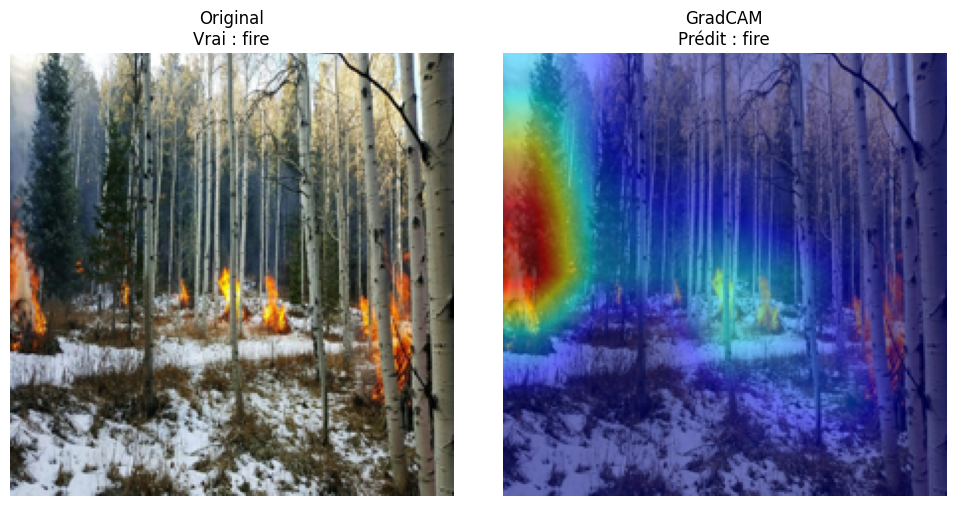

In [ ]:
# ------------------------------------------------------------------
# Générer un GradCAM sur une image du test set
# ------------------------------------------------------------------

import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

model.eval()

# -------------------------------------------------
# Wrapper HuggingFace : retourner seulement les logits
# -------------------------------------------------
class HFWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(pixel_values=x).logits

wrapped_model = HFWrapper(model).to(device)
wrapped_model.eval()

# -------------------------------------------------
# Réactiver temporairement les gradients pour GradCAM
# -------------------------------------------------
for param in model.efficientnet.parameters():
    param.requires_grad = True

# -------------------------------------------------
# Target layer EfficientNet-B0
# -------------------------------------------------
target_layers = [model.efficientnet.encoder.blocks[-1].projection.project_conv]

print("Target layer utilisée :")
print(target_layers[0])

# -------------------------------------------------
# Choisir une image du test set
# -------------------------------------------------
idx = 0  # tu peux changer l'indice

input_tensor, true_label = test_dataset[idx]
input_tensor = input_tensor.unsqueeze(0).to(device)

# Image originale pour affichage
img_path, _ = test_dataset.samples[idx]
pil_img = Image.open(img_path).convert("RGB").resize((224, 224))
rgb_img = np.array(pil_img).astype(np.float32) / 255.0

# -------------------------------------------------
# Prédiction
# -------------------------------------------------
with torch.no_grad():
    logits = wrapped_model(input_tensor)
    pred_class = torch.argmax(logits, dim=1).item()

print("Vraie classe   :", test_dataset.classes[true_label])
print("Classe prédite :", test_dataset.classes[pred_class])

# -------------------------------------------------
# GradCAM
# -------------------------------------------------
cam = GradCAM(
    model=wrapped_model,
    target_layers=target_layers
)

targets = [ClassifierOutputTarget(pred_class)]

grayscale_cam = cam(
    input_tensor=input_tensor,
    targets=targets
)[0]

cam_image = show_cam_on_image(
    rgb_img,
    grayscale_cam,
    use_rgb=True
)

# -------------------------------------------------
# Affichage
# -------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(rgb_img)
axes[0].set_title(f"Original\nVrai : {test_dataset.classes[true_label]}")
axes[0].axis("off")

axes[1].imshow(cam_image)
axes[1].set_title(f"GradCAM\nPrédit : {test_dataset.classes[pred_class]}")
axes[1].axis("off")

plt.tight_layout()
plt.show()

# -------------------------------------------------
# Re-geler le backbone après GradCAM
# -------------------------------------------------
for param in model.efficientnet.parameters():
    param.requires_grad = False

<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://github.com/jacobgil/pytorch-grad-cam" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">pytorch-grad-cam (GitHub)</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Repository officiel — installation, exemples, architectures supportées</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#f3e5f5;color:#6c3483;font-family:monospace;flex-shrink:0;white-space:nowrap;">TUTO</span>
<div style="flex:1;"><a href="https://github.com/jacobgil/pytorch-grad-cam/blob/master/tutorials/vision_transformers.md" target="_blank" style="font-size:12.5px;color:#6c3483;font-weight:600;text-decoration:none;">GradCAM sur Vision Transformers</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide spécifique pour ViT et Swin — reshape_transform, target layers</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://adataodyssey.com/grad-cam/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Grad-CAM explained visually</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tutoriel détaillé avec schémas et code PyTorch pas a pas</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Le modèle regarde-t-il le feu ?</b> (1) La heatmap pointe-t-elle vers les flammes ou la fumée ? (2) Le modèle détecté-t-il la FUMÉE quand il n'y a pas encore de flamme visible ? (c'est crucial pour la détection précoce). (3) Si le GradCAM pointe vers le ciel orange d'un coucher de soleil, comment corriger ?</span></p>

In [ ]:
print("""
- La heatmap pointe partiellement vers le feu surtout sur la zone gauche où l'on voit des flammes.
Mais elle ne couvre pas toutes les flammes visibles notamment celles au centre et à droite.
Le modèle prédit donc correctement fire mais il ne localise pas parfaitement toutes les zones de feu.

- Sur cette image il y a déjà des flammes visibles.
On ne peut donc pas conclure que le modèle détecte bien la fumée seule.
Il faudrait tester GradCAM sur des images avec fumée sans flamme visible pour vérifier la détection précoce.

- Si GradCAM pointe vers un ciel orange ou un coucher de soleil cela signifie que le modèle utilise un mauvais indice visuel.
Pour corriger cela, il faudrait ajouter plus d'images no_fire avec ciel orange, brume ou lumière chaude et utiliser des augmentations de luminosité/couleur pour réduire ce biais.
""")


- La heatmap pointe partiellement vers le feu surtout sur la zone gauche où l'on voit des flammes.
Mais elle ne couvre pas toutes les flammes visibles notamment celles au centre et à droite.
Le modèle prédit donc correctement fire mais il ne localise pas parfaitement toutes les zones de feu.

- Sur cette image il y a déjà des flammes visibles.
On ne peut donc pas conclure que le modèle détecte bien la fumée seule.
Il faudrait tester GradCAM sur des images avec fumée sans flamme visible pour vérifier la détection précoce.

- Si GradCAM pointe vers un ciel orange ou un coucher de soleil cela signifie que le modèle utilise un mauvais indice visuel.
Pour corriger cela, il faudrait ajouter plus d'images no_fire avec ciel orange, brume ou lumière chaude et utiliser des augmentations de luminosité/couleur pour réduire ce biais.



---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Comparer une bonne prédiction et une erreur.</b> générer le GradCAM pour un cas réussi et un cas rate. Afficher les deux côté a côté. Le modèle regarde-t-il les mêmes zones ? Si non, cela explique l'erreur.</span></p>

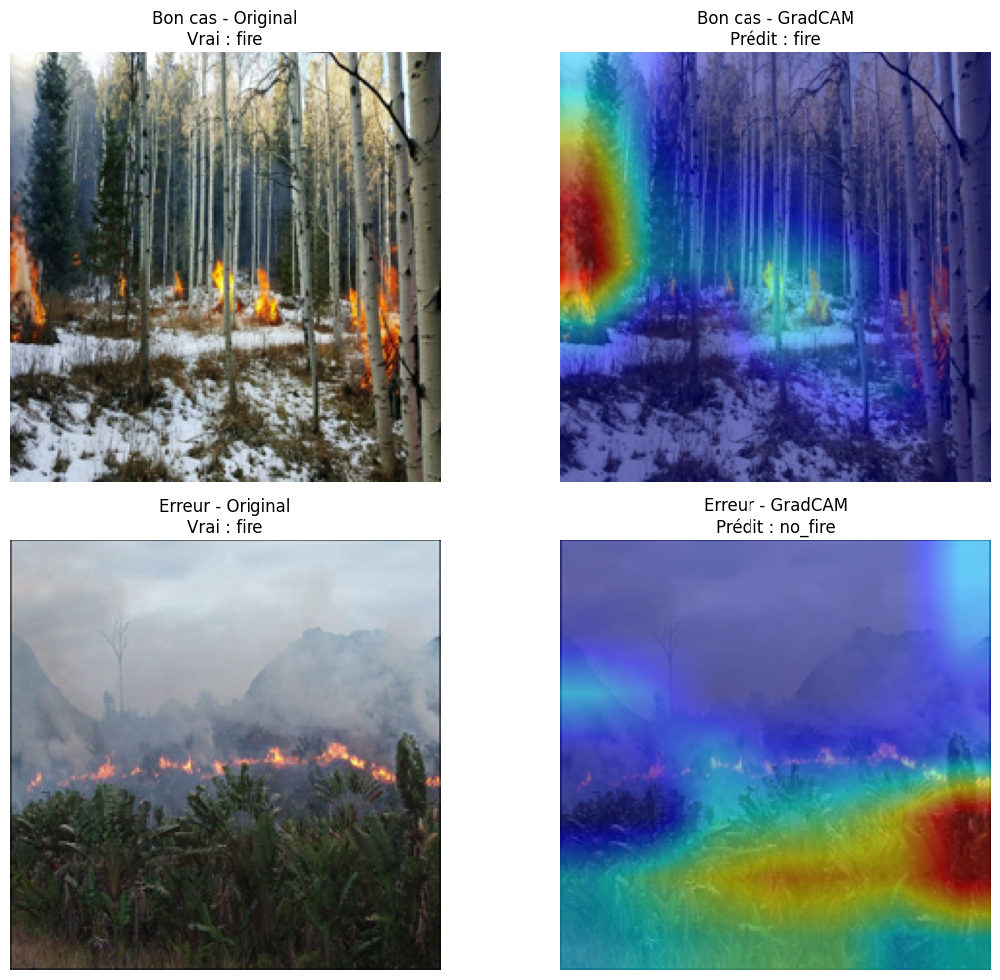

Index bon cas  : 0
Index erreur   : 1


In [ ]:
# Votre code ici

# ------------------------------------------------------------------
# Comparer une bonne prédiction et une erreur avec GradCAM
# ------------------------------------------------------------------

import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

model.eval()

# Wrapper HuggingFace -> logits
class HFWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(pixel_values=x).logits

wrapped_model = HFWrapper(model).to(device)
wrapped_model.eval()

# Réactiver temporairement les gradients pour GradCAM
for param in model.efficientnet.parameters():
    param.requires_grad = True

# Target layer EfficientNet-B0
target_layers = [model.efficientnet.encoder.blocks[-1].projection.project_conv]

# IDs des classes
fire_id = test_dataset.classes.index("fire")
no_fire_id = test_dataset.classes.index("no_fire")

# 1) Trouver un cas réussi : vrai fire, prédit fire
correct_indices = np.where((y_true == fire_id) & (y_pred == fire_id))[0]
good_idx = correct_indices[0]

# 2) Trouver un cas raté : faux négatif si possible, sinon toute erreur
false_negative_indices = np.where((y_true == fire_id) & (y_pred == no_fire_id))[0]

if len(false_negative_indices) > 0:
    bad_idx = false_negative_indices[0]
else:
    error_indices = np.where(y_true != y_pred)[0]
    bad_idx = error_indices[0]

# Fonction GradCAM
def generate_gradcam(idx):
    input_tensor, true_label = test_dataset[idx]
    input_tensor = input_tensor.unsqueeze(0).to(device)

    img_path, _ = test_dataset.samples[idx]
    pil_img = Image.open(img_path).convert("RGB").resize((224, 224))
    rgb_img = np.array(pil_img).astype(np.float32) / 255.0

    with torch.no_grad():
        logits = wrapped_model(input_tensor)
        pred_class = torch.argmax(logits, dim=1).item()

    cam = GradCAM(model=wrapped_model, target_layers=target_layers)
    targets = [ClassifierOutputTarget(pred_class)]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
    cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    return rgb_img, cam_image, true_label, pred_class

# Générer les deux GradCAM
good_rgb, good_cam, good_true, good_pred = generate_gradcam(good_idx)
bad_rgb, bad_cam, bad_true, bad_pred = generate_gradcam(bad_idx)

# Affichage
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0, 0].imshow(good_rgb)
axes[0, 0].set_title(f"Bon cas - Original\nVrai : {test_dataset.classes[good_true]}")
axes[0, 0].axis("off")

axes[0, 1].imshow(good_cam)
axes[0, 1].set_title(f"Bon cas - GradCAM\nPrédit : {test_dataset.classes[good_pred]}")
axes[0, 1].axis("off")

axes[1, 0].imshow(bad_rgb)
axes[1, 0].set_title(f"Erreur - Original\nVrai : {test_dataset.classes[bad_true]}")
axes[1, 0].axis("off")

axes[1, 1].imshow(bad_cam)
axes[1, 1].set_title(f"Erreur - GradCAM\nPrédit : {test_dataset.classes[bad_pred]}")
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

print("Index bon cas  :", good_idx)
print("Index erreur   :", bad_idx)

# Re-geler le backbone
for param in model.efficientnet.parameters():
    param.requires_grad = False

In [ ]:
print("""
Sur le cas réussi le GradCAM devrait idéalement se concentrer sur les flammes ou la fumée.
Sur le cas raté si la heatmap regarde une zone peu pertinente (comme la végétation) cela peut expliquer l'erreur.

Si le modèle ne regarde pas les mêmes zones dans le cas réussi et dans le cas raté cela montre qu'il ne s'appuie pas toujours sur les bons indices visuels.
Cela peut expliquer pourquoi il se trompe sur certaines images difficiles.
""")


Sur le cas réussi le GradCAM devrait idéalement se concentrer sur les flammes ou la fumée.
Sur le cas raté si la heatmap regarde une zone peu pertinente (comme la végétation) cela peut expliquer l'erreur.

Si le modèle ne regarde pas les mêmes zones dans le cas réussi et dans le cas raté cela montre qu'il ne s'appuie pas toujours sur les bons indices visuels.
Cela peut expliquer pourquoi il se trompe sur certaines images difficiles.



---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Préparer 3 visualisations GradCAM pour la démo.</b> 2 prédictions correctes + 1 erreur. Pour chaque : image originale, heatmap, overlay, prédiction + score.</span></p>

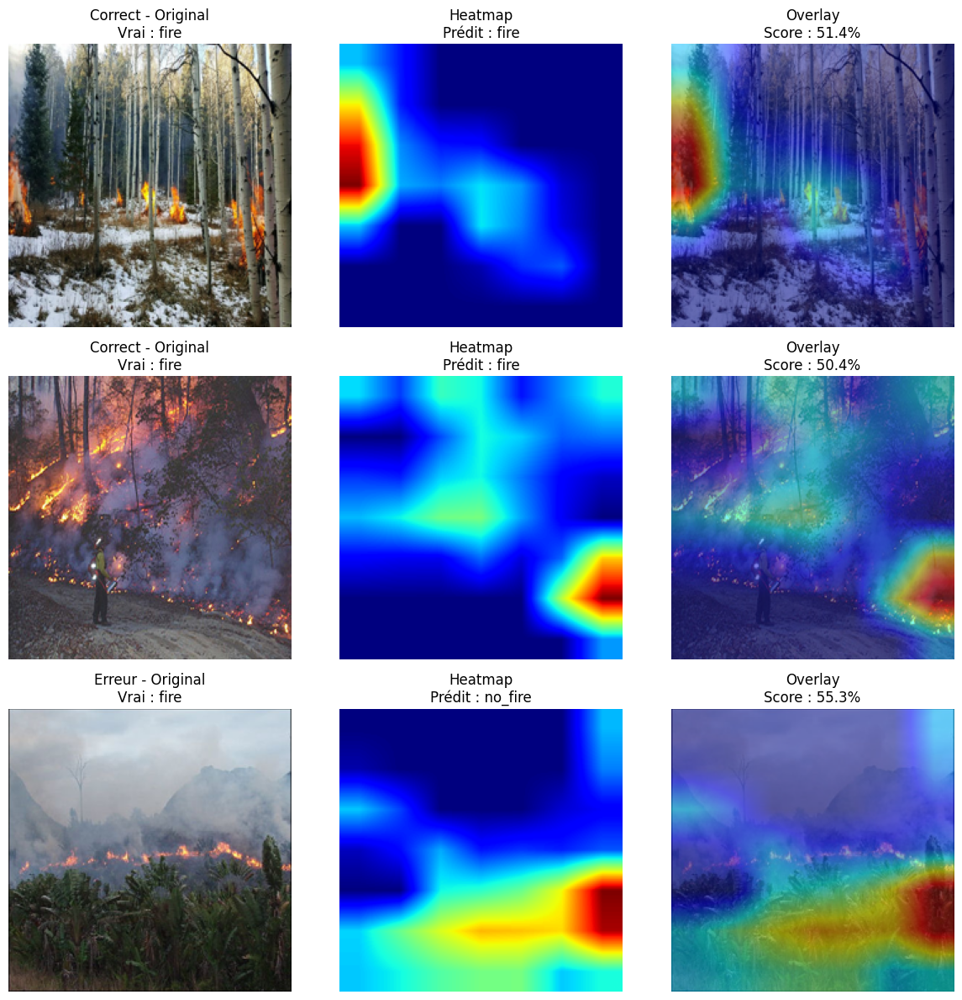

Exemple 1 | index=0 | Correct | vrai=fire | prédit=fire | score=51.4%
Exemple 2 | index=2 | Correct | vrai=fire | prédit=fire | score=50.4%
Exemple 3 | index=1 | Erreur | vrai=fire | prédit=no_fire | score=55.3%


In [ ]:
# Votre code ici
# ------------------------------------------------------------------
# Préparer 3 visualisations GradCAM pour la démo
# 2 prédictions correctes + 1 erreur
# ------------------------------------------------------------------

import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

model.eval()

# Wrapper HuggingFace -> logits
class HFWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(pixel_values=x).logits

wrapped_model = HFWrapper(model).to(device)
wrapped_model.eval()

# Réactiver temporairement les gradients pour GradCAM
for param in model.efficientnet.parameters():
    param.requires_grad = True

# Target layer EfficientNet-B0
target_layers = [model.efficientnet.encoder.blocks[-1].projection.project_conv]

# -------------------------------------------------
# Sélectionner 2 bonnes prédictions + 1 erreur
# -------------------------------------------------

correct_indices = np.where(y_true == y_pred)[0]
error_indices = np.where(y_true != y_pred)[0]

# On prend 2 bonnes prédictions
good_1 = correct_indices[0]
good_2 = correct_indices[1]

# On prend 1 erreur
bad_1 = error_indices[0]

selected_indices = [good_1, good_2, bad_1]

# -------------------------------------------------
# Fonction GradCAM pour une image
# -------------------------------------------------

def generate_gradcam_demo(idx):
    # image transformée pour le modèle
    input_tensor, true_label = test_dataset[idx]
    input_tensor = input_tensor.unsqueeze(0).to(device)

    # image originale pour affichage
    img_path, _ = test_dataset.samples[idx]
    pil_img = Image.open(img_path).convert("RGB").resize((224, 224))
    rgb_img = np.array(pil_img).astype(np.float32) / 255.0

    # prédiction
    with torch.no_grad():
        logits = wrapped_model(input_tensor)
        probs = torch.softmax(logits, dim=1).cpu().numpy()[0]
        pred_class = int(np.argmax(probs))
        pred_score = float(probs[pred_class])

    # GradCAM
    cam = GradCAM(model=wrapped_model, target_layers=target_layers)
    targets = [ClassifierOutputTarget(pred_class)]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]

    # Overlay
    cam_overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    return {
        "original": rgb_img,
        "heatmap": grayscale_cam,
        "overlay": cam_overlay,
        "true_label": true_label,
        "pred_class": pred_class,
        "pred_score": pred_score,
        "idx": idx
    }

# Générer les 3 visualisations
results = [generate_gradcam_demo(idx) for idx in selected_indices]

# -------------------------------------------------
# Affichage : 3 lignes x 3 colonnes
# Original / Heatmap / Overlay
# -------------------------------------------------

fig, axes = plt.subplots(3, 3, figsize=(12, 12))

for row, res in enumerate(results):
    true_name = test_dataset.classes[res["true_label"]]
    pred_name = test_dataset.classes[res["pred_class"]]
    score = res["pred_score"] * 100
    status = "Correct" if res["true_label"] == res["pred_class"] else "Erreur"

    # Original
    axes[row, 0].imshow(res["original"])
    axes[row, 0].set_title(
        f"{status} - Original\nVrai : {true_name}"
    )
    axes[row, 0].axis("off")

    # Heatmap
    axes[row, 1].imshow(res["heatmap"], cmap="jet")
    axes[row, 1].set_title(
        f"Heatmap\nPrédit : {pred_name}"
    )
    axes[row, 1].axis("off")

    # Overlay
    axes[row, 2].imshow(res["overlay"])
    axes[row, 2].set_title(
        f"Overlay\nScore : {score:.1f}%"
    )
    axes[row, 2].axis("off")

plt.tight_layout()
plt.show()

# Afficher aussi un résumé texte
for i, res in enumerate(results, 1):
    true_name = test_dataset.classes[res["true_label"]]
    pred_name = test_dataset.classes[res["pred_class"]]
    score = res["pred_score"] * 100
    status = "Correct" if res["true_label"] == res["pred_class"] else "Erreur"
    print(f"Exemple {i} | index={res['idx']} | {status} | vrai={true_name} | prédit={pred_name} | score={score:.1f}%")

# Re-geler le backbone après GradCAM
for param in model.efficientnet.parameters():
    param.requires_grad = False

In [ ]:
print("""
Les deux cas corrects montrent si le modèle regarde bien les zones pertinentes, comme les flammes ou la fumée.
Le cas erroné permet de voir si le modèle s'appuie sur de mauvais indices visuels, par exemple le ciel, la végétation ou une lumière chaude.
Cette comparaison aide à comprendre non seulement si le modèle a raison, mais aussi pourquoi.
""")


Les deux cas corrects montrent si le modèle regarde bien les zones pertinentes, comme les flammes ou la fumée.
Le cas erroné permet de voir si le modèle s'appuie sur de mauvais indices visuels, par exemple le ciel, la végétation ou une lumière chaude.
Cette comparaison aide à comprendre non seulement si le modèle a raison, mais aussi pourquoi.



In [ ]:
display(HTML('<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 6 validee.</b> <span style="color:#1e5631;">GradCAM genere.</span></div>'))

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>GradCAM comme outil de confiance.</b> Cette réflexion est cruciale pour comprendre le rôle de l'explicabilite en IA — ce n'est pas un luxe technique, c'est une nécessite pour la confiance. (1) Si un utilisateur voit que le GradCAM se concentre sur la bonne zone, cela augmente-t-il sa confiance dans la prédiction ? (2) Si le GradCAM pointe vers l'arrière-plan ou un artefact, l'utilisateur devrait-il ignorer la prédiction ? (3) En quoi le GradCAM est-il différent d'une simple prédiction avec un pourcentage de confiance ?</span></p>

In [ ]:
# Votre reponse ici
print("""
- Oui, si le GradCAM se concentre sur la bonne zone, cela augmente la confiance dans la prédiction.

Par exemple, si le modèle prédit fire et que la heatmap regarde les flammes ou la fumée, on comprend mieux pourquoi il a pris cette décision.
Cela montre que le modèle utilise des indices pertinents.

- Si le GradCAM pointe vers l'arrière-plan ou un artefact, il faut être prudent.

La prédiction ne doit pas forcément être ignorée automatiquement, mais elle doit être vérifiée.
Cela peut indiquer que le modèle a donné la bonne réponse pour une mauvaise raison, par exemple en se basant sur le ciel, la lumière ou une zone sans rapport avec le feu.

- GradCAM donne une information différente du pourcentage de confiance.

Le pourcentage indique à quel point le modèle est sûr de sa prédiction.
GradCAM montre où le modèle a regardé dans l'image pour prendre sa décision.

Donc une prédiction à 95 % peut sembler fiable, mais si le GradCAM montre que le modèle regarde une zone non pertinente, cette confiance est moins crédible.
""")


- Oui, si le GradCAM se concentre sur la bonne zone, cela augmente la confiance dans la prédiction.

Par exemple, si le modèle prédit fire et que la heatmap regarde les flammes ou la fumée, on comprend mieux pourquoi il a pris cette décision.
Cela montre que le modèle utilise des indices pertinents.

- Si le GradCAM pointe vers l'arrière-plan ou un artefact, il faut être prudent.

La prédiction ne doit pas forcément être ignorée automatiquement, mais elle doit être vérifiée.
Cela peut indiquer que le modèle a donné la bonne réponse pour une mauvaise raison, par exemple en se basant sur le ciel, la lumière ou une zone sans rapport avec le feu.

- GradCAM donne une information différente du pourcentage de confiance.

Le pourcentage indique à quel point le modèle est sûr de sa prédiction.
GradCAM montre où le modèle a regardé dans l'image pour prendre sa décision.

Donc une prédiction à 95 % peut sembler fiable, mais si le GradCAM montre que le modèle regarde une zone non pertinente, cet

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>générer un GradCAM sur les images les plus incertaines.</b> L'objectif est de comprendre POURQUOI le modèle hésité. Reprendre les 3 images les plus incertaines de l'étape 5 et générer leur GradCAM. Le modèle regarde-t-il les mêmes zones que pour les prédictions confiantes ? Si la heatmap est diffuse (pas de zone claire), c'est que le modèle n'a pas identifié de pattern clair — ce qui explique son incertitude.</span></p>

Indices des 3 images les plus incertaines : [105  31 112]


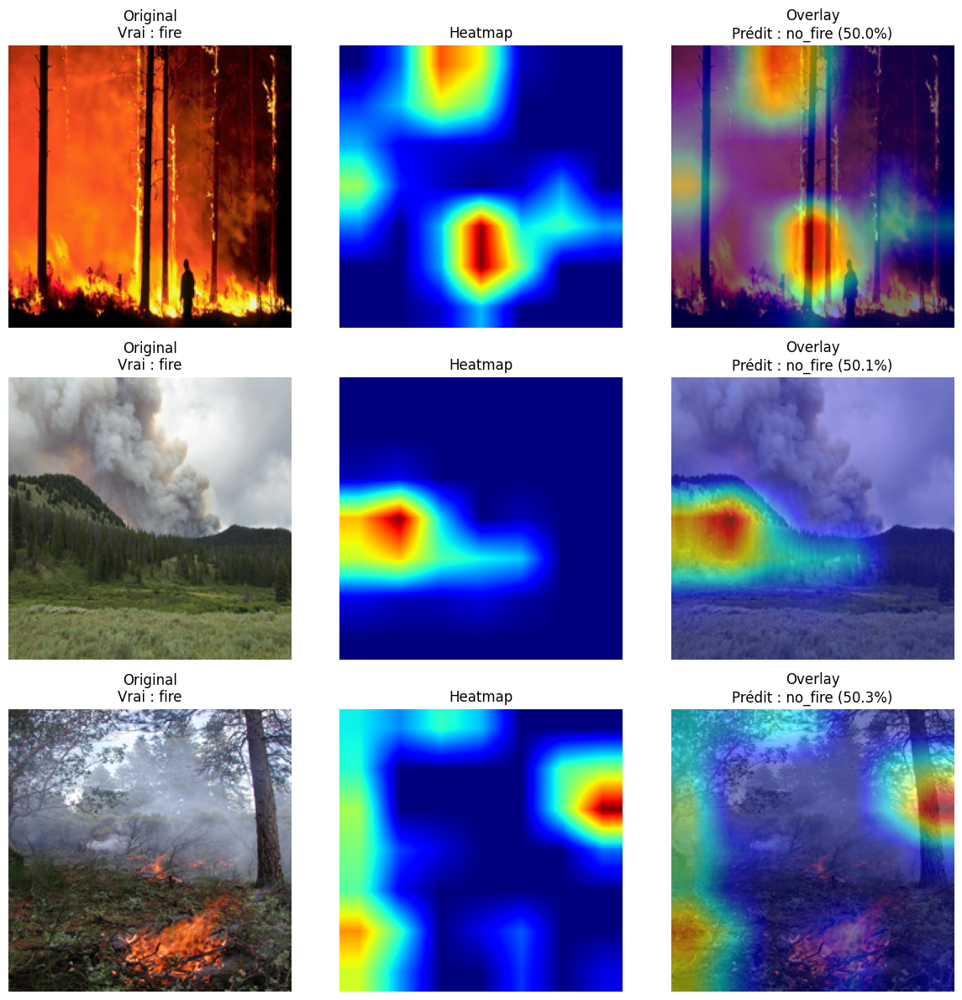

Index 105 | vrai=fire | prédit=no_fire | probas=[0.49990255 0.5000974 ]
Index 31 | vrai=fire | prédit=no_fire | probas=[0.4990735 0.5009265]
Index 112 | vrai=fire | prédit=no_fire | probas=[0.4971671 0.5028329]


In [ ]:
# Votre code ici
# ------------------------------------------------------------------
# GradCAM sur les 3 images les plus incertaines
# ------------------------------------------------------------------

import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

model.eval()

# Wrapper HuggingFace -> logits
class HFWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(pixel_values=x).logits

wrapped_model = HFWrapper(model).to(device)
wrapped_model.eval()

# Réactiver les gradients pour GradCAM
for param in model.efficientnet.parameters():
    param.requires_grad = True

# Target layer EfficientNet-B0
target_layers = [model.efficientnet.encoder.blocks[-1].projection.project_conv]

# ------------------------------------------------------------------
# 1) Retrouver les 3 images les plus incertaines
# ------------------------------------------------------------------

max_probs = np.max(y_proba, axis=1)
uncertainty_scores = np.abs(max_probs - 0.5)

# Plus le score est petit, plus le modèle est incertain
uncertain_indices = np.argsort(uncertainty_scores)[:3]

print("Indices des 3 images les plus incertaines :", uncertain_indices)

# ------------------------------------------------------------------
# 2) Fonction pour générer GradCAM
# ------------------------------------------------------------------

def generate_gradcam_uncertain(idx):
    input_tensor, true_label = test_dataset[idx]
    input_tensor = input_tensor.unsqueeze(0).to(device)

    img_path, _ = test_dataset.samples[idx]
    pil_img = Image.open(img_path).convert("RGB").resize((224, 224))
    rgb_img = np.array(pil_img).astype(np.float32) / 255.0

    with torch.no_grad():
        logits = wrapped_model(input_tensor)
        probs = torch.softmax(logits, dim=1).cpu().numpy()[0]
        pred_class = int(np.argmax(probs))
        pred_score = float(probs[pred_class])

    cam = GradCAM(model=wrapped_model, target_layers=target_layers)
    targets = [ClassifierOutputTarget(pred_class)]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]

    overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    return rgb_img, grayscale_cam, overlay, true_label, pred_class, pred_score, probs

# ------------------------------------------------------------------
# 3) Afficher original / heatmap / overlay
# ------------------------------------------------------------------

fig, axes = plt.subplots(3, 3, figsize=(12, 12))

for row, idx in enumerate(uncertain_indices):
    rgb_img, heatmap, overlay, true_label, pred_class, pred_score, probs = generate_gradcam_uncertain(idx)

    true_name = test_dataset.classes[true_label]
    pred_name = test_dataset.classes[pred_class]

    axes[row, 0].imshow(rgb_img)
    axes[row, 0].set_title(f"Original\nVrai : {true_name}")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(heatmap, cmap="jet")
    axes[row, 1].set_title("Heatmap")
    axes[row, 1].axis("off")

    axes[row, 2].imshow(overlay)
    axes[row, 2].set_title(
        f"Overlay\nPrédit : {pred_name} ({pred_score*100:.1f}%)"
    )
    axes[row, 2].axis("off")

plt.tight_layout()
plt.show()

# Résumé texte
for idx in uncertain_indices:
    true_name = test_dataset.classes[y_true[idx]]
    pred_name = test_dataset.classes[y_pred[idx]]
    print(
        f"Index {idx} | vrai={true_name} | prédit={pred_name} | "
        f"probas={y_proba[idx]}"
    )

# Re-geler le backbone après GradCAM
for param in model.efficientnet.parameters():
    param.requires_grad = False

In [ ]:
print("""
Les images les plus incertaines sont celles où le modèle donne des probabilités proches de 50 %.

Avec GradCAM, on peut vérifier si cette hésitation vient du fait que le modèle ne trouve pas de zone clairement pertinente.
Si la heatmap est diffuse ou concentrée sur des zones peu liées au feu, cela explique l'incertitude.

Contrairement aux prédictions confiantes, où la heatmap devrait se concentrer sur des flammes ou de la fumée,
les cas incertains peuvent montrer des activations moins nettes : brume, ciel, végétation, lumière chaude ou arrière-plan.
Ces images sont donc utiles pour comprendre les limites du modèle et améliorer le dataset.
""")


Les images les plus incertaines sont celles où le modèle donne des probabilités proches de 50 %.

Avec GradCAM, on peut vérifier si cette hésitation vient du fait que le modèle ne trouve pas de zone clairement pertinente.
Si la heatmap est diffuse ou concentrée sur des zones peu liées au feu, cela explique l'incertitude.

Contrairement aux prédictions confiantes, où la heatmap devrait se concentrer sur des flammes ou de la fumée,
les cas incertains peuvent montrer des activations moins nettes : brume, ciel, végétation, lumière chaude ou arrière-plan.
Ces images sont donc utiles pour comprendre les limites du modèle et améliorer le dataset.



<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 07/09 — 1H15</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Interface Streamlit + déploiement cloud</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Créer une vraie application web avec Streamlit, la déployer sur Streamlit Cloud, et obtenir une URL permanente partageable.</div></div>

<div style="border-left:4px solid #e67e22;background:#e67e220a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#e67e22;margin-bottom:8px;">Streamlit vs Gradio — pourquoi changer ?</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>Streamlit</b> est un framework Python pour créer des applications web interactives en quelques lignes de code. Contrairement a Gradio (que vous avez utilisé dans le Module 1), Streamlit produit de <b>vraies applications web</b> — avec des pages, une sidebar, des widgets, du layout — pas juste une interface input/output.<br><br>
<div style='display:grid;grid-template-columns:1fr 1fr;gap:10px;'>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;'>
<b>Gradio (Module 1)</b><br>
Interface input &#8594; output simple<br>
Idéal pour une démo rapide en 5 min<br>
Lien temporaire (72h max)<br>
Peu de contrôle sur le design</div>
<div style='background:#e8f5e9;border-radius:8px;padding:12px;border:1px solid #4caf50;'>
<b>Streamlit (Module 2)</b><br>
Application web complète (pages, sidebar, layout)<br>
Déployable en permanence sur Streamlit Cloud<br>
URL permanente, partageable, professionnelle<br>
contrôle total sur l'interface</div></div><br>
<em>Analogie : Gradio, c'est un stand de démonstration dans un salon. Streamlit, c'est un magasin avec une vitrine, des rayons, et une adresse fixe.</em></div></div>

<div style="border-left:4px solid #2d5986;background:#2d59860a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#2d5986;margin-bottom:8px;">Pourquoi Streamlit est important en entreprise</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>Pourquoi Streamlit est important pour votre carrière</b><br><br>
En entreprise, un modèle de ML qui reste dans un notebook Jupyter n'a <b>aucune valeur business</b>. Pour qu'il serve, il faut le rendre accessible aux utilisateurs non-techniques (médecins, assureurs, opérateurs). Streamlit est devenu le standard pour :<br><br>
<b>1. Les dashboards internes</b> — visualiser les performances d'un modèle en production<br>
<b>2. Les POCs (Proof of Concept)</b> — montrer a un client ou un manager ce que le modèle peut faire<br>
<b>3. Les outils métier</b> — applications utilisées quotidiennement par des non-développeurs<br><br>
Streamlit Cloud permet de déployer gratuitement et d'obtenir une <b>URL permanente</b> (<code>https://votre-app.streamlit.app</code>). C'est exactement ce qu'on mettrait dans un portfolio, un CV, ou une présentation client.<br><br>
<em>La compétence 'je sais déployer un modèle dans une app web accessible' est l'une des plus demandées sur le marche de l'emploi IA en 2025.</em></div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Les bases de Streamlit en 2 minutes</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>Les 5 commandes Streamlit essentielles</b><br><br>
Streamlit fonctionne de façon très simple : vous écrivez un script Python normal, et Streamlit le transforme en application web. Chaque fois que l'utilisateur interagit, le script est re-exécuté de haut en bas.<br><br>
<div style='display:grid;grid-template-columns:1fr 1fr;gap:8px;'>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.title("Mon app")</b><br>
Affiche un titre en gros</div>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.write("Texte")</b><br>
Affiche du texte, des tableaux, du markdown</div>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.image(img)</b><br>
Affiche une image (PIL, numpy, URL)</div>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.file_uploader("label")</b><br>
Widget d'upload de fichier</div>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.columns([1,1])</b><br>
Layout en colonnes</div>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.sidebar.write(...)</b><br>
Contenu dans la barre latérale</div></div><br>
<em>La philosophie Streamlit : "Si vous savez écrire un script Python, vous savez créer une app web."</em></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Installer Streamlit.</b> <code>pip install streamlit</code>. Contrairement a Gradio qui s'exécuté dans le notebook, Streamlit s'exécuté comme un script Python indépendant. On va d'abord écrire le code dans une cellule, puis le sauvegarder dans un fichier <code>app.py</code>, et enfin le lancer avec <code>streamlit run app.py</code>.</span></p>

In [ ]:
!pip install streamlit -q
import streamlit
print(f'Streamlit {streamlit.__version__} installe.')


Streamlit 1.57.0 installe.


In [ ]:
trainer.save_model("fire_model")
print("Modèle sauvegardé dans le dossier fire_model")

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Modèle sauvegardé dans le dossier fire_model


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.streamlit.io/develop/api-reference" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">Streamlit API référence</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Référence complète — st.title, st.image, st.file_uploader, st.columns, etc.</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#f3e5f5;color:#6c3483;font-family:monospace;flex-shrink:0;white-space:nowrap;">TUTO</span>
<div style="flex:1;"><a href="https://docs.streamlit.io/get-started" target="_blank" style="font-size:12.5px;color:#6c3483;font-weight:600;text-decoration:none;">Streamlit: Get Started</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide officiel pour débuter avec Streamlit — 30 min pour tout comprendre</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://towardsdatascience.com/demo-your-model-with-streamlit-a76011467dfb/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Deploy DL Image Classifier with Streamlit</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tutoriel complet : charger un modèle PyTorch, upload d'image, prédiction</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Construire l'application étape par étape.</b> L'objectif est de créer une application web professionnelle pour le domaine 'Surveillance environnementale'. On va la construire progressivement dans la cellule ci-dessous. Le code complet sera sauvegarde dans un fichier <code>app.py</code>. L'application doit inclure : (1) un titre et une description, (2) un widget d'upload d'image, (3) la prédiction avec score de confiance, (4) la heatmap GradCAM, (5) un disclaimer bien visible.</span></p>

In [ ]:
%%writefile app.py
import streamlit as st
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torchvision import transforms
from transformers import AutoModelForImageClassification

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# ── Configuration de la page ──
st.set_page_config(
    page_title="Detecteur de feux de foret",
    page_icon="🔥",
    layout="wide"
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── Charger le modele sauvegarde ──
@st.cache_resource
def load_model():
    model = AutoModelForImageClassification.from_pretrained("fire_model")
    model.to(device)
    model.eval()
    return model

model = load_model()

# Attention : ton mapping est 0 = fire, 1 = no_fire
class_names = ["fire", "no_fire"]

# ── Transform d'evaluation, sans augmentation ──
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# ── Wrapper pour GradCAM ──
class HFWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(pixel_values=x).logits

wrapped_model = HFWrapper(model).to(device)
wrapped_model.eval()

# GradCAM a besoin des gradients sur le backbone
for param in model.efficientnet.parameters():
    param.requires_grad = True

# Target layer EfficientNet-B0
target_layers = [model.efficientnet.encoder.blocks[-1].projection.project_conv]

# ── Sidebar ──
st.sidebar.title("A propos")
st.sidebar.info(
    "Systeme d'aide a la detection — toute alerte doit etre confirmee par un operateur humain avant mobilisation."
)
st.sidebar.markdown("---")
st.sidebar.markdown("**Modele :** EfficientNet-B0")
st.sidebar.markdown("**Classes :** fire, no_fire")

# ── Page principale ──
st.title("Detecteur de feux de foret")
st.markdown(
    "Uploadez une image pour obtenir une prediction "
    "avec score de confiance et visualisation GradCAM."
)

# ── Upload d'image ──
uploaded_file = st.file_uploader(
    "Choisir une image",
    type=["jpg", "jpeg", "png"],
    help="Formats acceptes : JPG, JPEG, PNG"
)

if uploaded_file is not None:
    image = Image.open(uploaded_file).convert("RGB")

    # Layout en 2 colonnes
    col1, col2 = st.columns(2)

    with col1:
        st.subheader("Image originale")
        st.image(image, use_container_width=True)

    with col2:
        st.subheader("Analyse")

        with st.spinner("Analyse en cours..."):
            # 1. Appliquer val_transform a l'image
            input_tensor = val_transform(image).unsqueeze(0).to(device)

            # 2. Predire avec le modele
            with torch.no_grad():
                logits = wrapped_model(input_tensor)

            # 3. Calculer les probabilites
            probs = torch.softmax(logits, dim=1)[0]
            pred_idx = torch.argmax(probs).item()
            pred_class = class_names[pred_idx]
            confidence = probs[pred_idx].item() * 100

            # 4. Generer le GradCAM
            resized_img = image.resize((224, 224))
            rgb_img = np.array(resized_img).astype(np.float32) / 255.0

            cam = GradCAM(
                model=wrapped_model,
                target_layers=target_layers
            )

            targets = [ClassifierOutputTarget(pred_idx)]
            grayscale_cam = cam(
                input_tensor=input_tensor,
                targets=targets
            )[0]

            gradcam_overlay = show_cam_on_image(
                rgb_img,
                grayscale_cam,
                use_rgb=True
            )

            # 5. Afficher les resultats
            st.metric(
                label="Prediction",
                value=pred_class,
                delta=f"{confidence:.1f}%"
            )

            st.markdown("**Probabilites :**")
            st.write(f"- fire : {probs[0].item() * 100:.1f}%")
            st.write(f"- no_fire : {probs[1].item() * 100:.1f}%")

            st.image(
                gradcam_overlay,
                caption="Heatmap GradCAM",
                use_container_width=True
            )

    # ── Disclaimer en bas ──
    st.markdown("---")
    st.warning("Systeme d'aide a la detection — toute alerte doit etre confirmee par un operateur humain avant mobilisation.")

else:
    st.info("Uploadez une image pour commencer l'analyse.")

Overwriting app.py


In [ ]:
!streamlit run app.py --server.port 8501 &>/content/logs.txt &

In [ ]:
!npm install -g localtunnel

⠙⠹⠸⠼⠴⠦⠧⠇⠏⠋⠙⠹⠸⠼⠴⠦⠧⠇⠏⠋⠙⠹
added 22 packages in 3s
⠹
⠹3 packages are looking for funding
⠹  run `npm fund` for details
⠹

In [ ]:
!lt --port 8501

your url is: https://pink-vans-pick.loca.lt
^C


In [ ]:
!streamlit run app.py



2026-05-19 08:47:19.966 Uvicorn server started on 0.0.0.0:8501

  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://34.125.150.43:8501

  Stopping...


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comprendre la structure d'une app Streamlit.</b> Avant d'ajouter le modèle, comprenez l'architecture du code. (1) Que fait <code>st.set_page_config</code> ? Pourquoi le mettre en première ligne ? (indice : c'est la 'carte d'identité' de la page — titre, icône, layout). (2) A quoi sert <code>st.sidebar</code> ? Quel contenu y mettre ? (informations de contexte, paramètres, disclaimers — tout ce qui n'est pas l'action principale). (3) Que fait <code>st.columns(2)</code> ? Comment Streamlit géré-t-il le layout ? (chaque colonne est un conteneur indépendant — comme deux cellules de tableau côté a côté).</span></p>

In [ ]:
# Votre reponse ici

print("""
- st.set_page_config configure l'identité générale de la page Streamlit.

Il permet de définir le titre de l'onglet, l'icône de la page et le layout.
Dans notre application, il sert à donner un titre clair, une icône et un affichage large.

Il doit être placé au début du script, car Streamlit doit connaître la configuration de la page avant d'afficher les autres éléments.

- st.sidebar permet d'afficher une barre latérale.

Elle sert à mettre des informations de contexte qui ne sont pas l'action principale :
- description du système ;
- modèle utilisé ;
- classes prédites ;
- avertissement ou disclaimer ;
- éventuellement des paramètres.

Dans notre application, la sidebar explique que le modèle est un système d'aide à la détection et que toute alerte doit être confirmée par un humain.

- st.columns(2) divise la page en deux colonnes.

Chaque colonne est un conteneur indépendant.
Dans notre application, la colonne de gauche affiche l'image originale, et la colonne de droite affiche l'analyse du modèle : prédiction, probabilités et GradCAM.

Streamlit gère le layout de manière simple : on crée des blocs comme des colonnes, puis on écrit les éléments à l'intérieur avec `with col1:` et `with col2:`.
""")


- st.set_page_config configure l'identité générale de la page Streamlit.

Il permet de définir le titre de l'onglet, l'icône de la page et le layout.
Dans notre application, il sert à donner un titre clair, une icône et un affichage large.

Il doit être placé au début du script, car Streamlit doit connaître la configuration de la page avant d'afficher les autres éléments.

- st.sidebar permet d'afficher une barre latérale.

Elle sert à mettre des informations de contexte qui ne sont pas l'action principale :
- description du système ;
- modèle utilisé ;
- classes prédites ;
- avertissement ou disclaimer ;
- éventuellement des paramètres.

Dans notre application, la sidebar explique que le modèle est un système d'aide à la détection et que toute alerte doit être confirmée par un humain.

- st.columns(2) divise la page en deux colonnes.

Chaque colonne est un conteneur indépendant.
Dans notre application, la colonne de gauche affiche l'image originale, et la colonne de droite affiche l'

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Ajouter la logique de prédiction.</b> L'objectif est de compléter le bloc <code>with st.spinner</code> dans <code>app.py</code>. Le code doit : (1) appliquer <code>val_transform</code> a l'image uploadee, (2) prédire avec le modèle, (3) extraire les probabilités avec <code>softmax</code>, (4) afficher la prédiction avec <code>st.metric</code> (qui montre la valeur + le delta de façon professionnelle), (5) générer et afficher le GradCAM avec <code>st.image</code>. Reecrivez le fichier <code>app.py</code> complet avec la logique implementee.</span></p>

In [ ]:

# TODO : recopier le code precedent et completer la logique de prediction
# Pensez a charger le modele avec @st.cache_resource pour ne le charger qu'une fois

%%writefile app.py
import streamlit as st
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torchvision import transforms
from transformers import AutoModelForImageClassification

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# ── Configuration de la page ──
st.set_page_config(
    page_title="Detecteur de feux de foret",
    page_icon="🔥",
    layout="wide"
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── Charger le modele une seule fois ──
@st.cache_resource
def load_model():
    model = AutoModelForImageClassification.from_pretrained("fire_model")
    model.to(device)
    model.eval()
    return model

model = load_model()

# Classes du modele : 0 = fire, 1 = no_fire
class_names = ["fire", "no_fire"]

# ── Transform d'evaluation, sans augmentation ──
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# ── Wrapper HuggingFace pour GradCAM ──
class HFWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(pixel_values=x).logits

wrapped_model = HFWrapper(model).to(device)
wrapped_model.eval()

# GradCAM a besoin des gradients sur le backbone
for param in model.efficientnet.parameters():
    param.requires_grad = True

target_layers = [model.efficientnet.encoder.blocks[-1].projection.project_conv]

# ── Sidebar ──
st.sidebar.title("A propos")
st.sidebar.info(
    "Systeme d'aide a la detection — toute alerte doit etre confirmee par un operateur humain avant mobilisation."
)
st.sidebar.markdown("---")
st.sidebar.markdown("**Modele :** EfficientNet-B0")
st.sidebar.markdown("**Classes :** fire, no_fire")

# ── Page principale ──
st.title("Detecteur de feux de foret")
st.markdown(
    "Uploadez une image pour obtenir une prediction "
    "avec score de confiance et visualisation GradCAM."
)

# ── Upload d'image ──
uploaded_file = st.file_uploader(
    "Choisir une image",
    type=["jpg", "jpeg", "png"],
    help="Formats acceptes : JPG, JPEG, PNG"
)

if uploaded_file is not None:
    image = Image.open(uploaded_file).convert("RGB")

    col1, col2 = st.columns(2)

    with col1:
        st.subheader("Image originale")
        st.image(image, use_container_width=True)

    with col2:
        st.subheader("Analyse")

        with st.spinner("Analyse en cours..."):
            # 1. Appliquer val_transform a l'image
            input_tensor = val_transform(image).unsqueeze(0).to(device)

            # 2. Predire avec le modele
            with torch.no_grad():
                logits = wrapped_model(input_tensor)

            # 3. Extraire les probabilites avec softmax
            probs = torch.softmax(logits, dim=1)[0]
            pred_idx = torch.argmax(probs).item()
            pred_class = class_names[pred_idx]
            confidence = probs[pred_idx].item() * 100

            # 4. Afficher la prediction avec st.metric
            st.metric(
                label="Prediction",
                value=pred_class,
                delta=f"{confidence:.1f}%"
            )

            st.markdown("**Probabilites :**")
            st.write(f"- fire : {probs[0].item() * 100:.1f}%")
            st.write(f"- no_fire : {probs[1].item() * 100:.1f}%")

            # 5. Generer et afficher le GradCAM
            resized_img = image.resize((224, 224))
            rgb_img = np.array(resized_img).astype(np.float32) / 255.0

            cam = GradCAM(
                model=wrapped_model,
                target_layers=target_layers
            )

            targets = [ClassifierOutputTarget(pred_idx)]
            grayscale_cam = cam(
                input_tensor=input_tensor,
                targets=targets
            )[0]

            gradcam_overlay = show_cam_on_image(
                rgb_img,
                grayscale_cam,
                use_rgb=True
            )

            st.image(
                gradcam_overlay,
                caption="Heatmap GradCAM",
                use_container_width=True
            )

    # ── Disclaimer en bas ──
    st.markdown("---")
    st.warning(
        "Systeme d'aide a la detection — toute alerte doit etre confirmee par un operateur humain avant mobilisation."
    )

else:
    st.info("Uploadez une image pour commencer l'analyse.")


Overwriting app.py


In [ ]:
!streamlit run app.py --server.port 8501 &>/content/logs.txt &

In [ ]:
!lt --port 8501

your url is: https://hip-apes-wait.loca.lt
^C


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.streamlit.io/develop/api-reference/caching-and-state/st.cache_resource" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">st.cache_resource</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Comment cacher le modèle pour ne le charger qu'une seule fois</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.streamlit.io/deploy/streamlit-community-cloud/deploy-your-app" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">Streamlit Cloud Deployment</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide officiel pour déployer sur Streamlit Cloud — étape par étape</div></div></div></div>

<div style="border-left:4px solid #17a2b8;background:#e8f8fd;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#0c7c8c;">Tip</div><div style="font-size:13px;color:#0a6674;line-height:1.7;margin-top:4px;"><b>Charger le modèle une seule fois</b> avec le décorateur <code>@st.cache_resource</code>. Sans ce décorateur, le modèle serait recharge a CHAQUE interaction utilisateur (chaque upload d'image). Avec le cache, il est charge une seule fois et reste en mémoire.<br><br><code>@st.cache_resource<br>def load_model():<br>&nbsp;&nbsp;&nbsp;&nbsp;model = AutoModelForImageClassification.from_pretrained(...)<br>&nbsp;&nbsp;&nbsp;&nbsp;return model</code></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tester l'application localement.</b> Lancer <code>!streamlit run app.py &</code> dans le notebook (le <code>&</code> lance en arrière-plan). Sur Google Colab, utiliser <code>!npx localtunnel --port 8501</code> pour obtenir un lien temporaire. Tester l'interface : uploader une image, vérifier la prédiction, le GradCAM, le disclaimer.</span></p>

In [ ]:
# Lancer Streamlit (sur Colab)
!streamlit run app.py &>/dev/null &

# Attendre le demarrage
import time; time.sleep(3)

# Creer un tunnel (Colab uniquement)
!npx localtunnel --port 8501


⠙⠹⠸⠼⠴your url is: https://tricky-bats-relate.loca.lt
^C


<div style="border-left:4px solid #d4a017;background:#fef9e7;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#7d6608;">Attention</div><div style="font-size:13px;color:#6e5b08;line-height:1.7;margin-top:4px;">Sur Google Colab, Streamlit ne s'affiche pas directement dans le notebook. Il faut utiliser un tunnel (<code>localtunnel</code> ou <code>ngrok</code>) pour obtenir une URL accessible. L'URL de localtunnel est temporaire — pour une URL permanente, on déploiera sur Streamlit Cloud.</div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Tester l'interface.</b> L'objectif est de vérifier que l'application fonctionne correctement AVANT de la déployer. (1) Uploadez une image avec des flammes évidentes. (2) Uploadez une image avec de la fumée mais pas de flamme visible. (3) Uploadez un coucher de soleil orange. Le modèle se laisse-t-il tromper ? (4) Le disclaimer est-il visible et clair ? Un utilisateur non-technique comprendrait-il les limites de l'outil ?</span></p>

In [ ]:
# Vos observations ici

print("""
- Image avec des flammes évidentes

Le modèle prédit correctement fire avec un score de confiance de 62,9 %.
Le GradCAM se concentre bien sur la zone lumineuse du feu et de la fumée.
L'interface fonctionne donc correctement sur ce cas évident, même si le score n'est pas extrêmement élevé.

- Image avec de la fumée mais peu ou pas de flammes visibles

Le modèle prédit aussi fire avec un score de 56,0 %.
C'est encourageant, car cela montre qu'il réagit à la fumée, ce qui est important pour la détection précoce.
Cependant, la confiance reste proche de 50 %, donc le modèle hésite encore beaucoup sur ce type d'image.

- Coucher de soleil orange

Le modèle prédit fire avec 52,5 %, alors qu'il ne s'agit pas d'un incendie.
Il se laisse donc tromper par les couleurs chaudes du coucher de soleil.
Le GradCAM semble se concentrer sur les zones orange et lumineuses, ce qui confirme un biais visuel.

- Disclaimer

Le disclaimer est visible dans la sidebar et en bas de page.
Il indique que le système est une aide à la détection et qu'une alerte doit être confirmée par un opérateur humain.
Le message est clair, mais on pourrait le renforcer en ajoutant que le modèle peut confondre des couchers de soleil, de la brume ou des lumières chaudes avec un feu.
""")


- Image avec des flammes évidentes

Le modèle prédit correctement fire avec un score de confiance de 62,9 %.
Le GradCAM se concentre bien sur la zone lumineuse du feu et de la fumée.
L'interface fonctionne donc correctement sur ce cas évident, même si le score n'est pas extrêmement élevé.

- Image avec de la fumée mais peu ou pas de flammes visibles

Le modèle prédit aussi fire avec un score de 56,0 %.
C'est encourageant, car cela montre qu'il réagit à la fumée, ce qui est important pour la détection précoce.
Cependant, la confiance reste proche de 50 %, donc le modèle hésite encore beaucoup sur ce type d'image.

- Coucher de soleil orange

Le modèle prédit fire avec 52,5 %, alors qu'il ne s'agit pas d'un incendie.
Il se laisse donc tromper par les couleurs chaudes du coucher de soleil.
Le GradCAM semble se concentrer sur les zones orange et lumineuses, ce qui confirme un biais visuel.

- Disclaimer

Le disclaimer est visible dans la sidebar et en bas de page.
Il indique que le systèm

---

<div style="border-left:4px solid #6c3483;background:#6c34830a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#6c3483;margin-bottom:8px;">Déployer sur Streamlit Cloud</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>Déployer sur Streamlit Cloud — une URL permanente en 5 min</b><br><br>
Streamlit Cloud héberge gratuitement vos applications. Le processus :<br><br>
<b>1.</b> Créer un repo GitHub avec 3 fichiers : <code>app.py</code> (votre code), <code>requirements.txt</code> (les dépendances), et votre modèle sauvegarde<br>
<b>2.</b> Se connecter a <a href='https://share.streamlit.io'>share.streamlit.io</a> avec votre compte GitHub<br>
<b>3.</b> Pointer vers votre repo &#8594; l'app est déployée en 2 min<br>
<b>4.</b> Vous obtenez une URL permanente : <code>https://votre-app.streamlit.app</code><br><br>
<em>C'est cette URL que vous partagerez dans votre portfolio, votre CV, et votre présentation de démo finale.</em></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Préparer le repo GitHub pour le déploiement.</b> L'objectif est de créer les 3 fichiers nécessaires au déploiement : (1) <code>app.py</code> — le code de l'application (déjà écrit), (2) <code>requirements.txt</code> — la liste des packages Python nécessaires, (3) le modèle sauvegarde (ou un script qui le téléchargé). Créer le <code>requirements.txt</code> avec les packages utilises.</span></p>

In [ ]:
%%writefile requirements.txt
torch
torchvision
transformers
Pillow
numpy
grad-cam
streamlit


Writing requirements.txt


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Sauvegarder le modèle pour le déploiement.</b> L'objectif est de rendre le modèle entraîne réutilisable sans avoir a le re-entraîner a chaque fois.<br><br>(1) Utiliser la méthode <b>save_pretrained</b> du modèle HuggingFace pour sauvegarder les poids dans un dossier local<br>(2) Vérifier que le dossier contient bien les fichiers de configuration et les poids<br>(3) Tester le rechargement en chargeant le modèle depuis ce dossier et en faisant une prédiction sur une image de test<br><br><em>En production, on entraîne une fois et on déploie le modèle sauvegarde. La méthode save_pretrained créé les fichiers au format HuggingFace, compatible avec from_pretrained pour le rechargement.</em></span></p>

In [ ]:
# Option 1 : sauvegarder localement
# model.save_pretrained('./model_weights')

# Option 2 : charger depuis HuggingFace Hub dans app.py
# model = AutoModelForImageClassification.from_pretrained('votre-username/votre-modele')


In [ ]:
model.save_pretrained('./fire_model')

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
!zip -r fire_model.zip fire_model

  adding: fire_model/ (stored 0%)
  adding: fire_model/model.safetensors (deflated 8%)
  adding: fire_model/training_args.bin (deflated 53%)
  adding: fire_model/config.json (deflated 60%)


<div style="border-left:4px solid #17a2b8;background:#e8f8fd;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#0c7c8c;">Tip</div><div style="font-size:13px;color:#0a6674;line-height:1.7;margin-top:4px;"><b>Déploiement pas a pas sur Streamlit Cloud :</b><br>1. Créer un repo GitHub (public ou prive)<br>2. Y pousser <code>app.py</code>, <code>requirements.txt</code>, et le modèle<br>3. Aller sur <a href='https://share.streamlit.io'>share.streamlit.io</a><br>4. Connecter votre compte GitHub<br>5. Sélectionner votre repo et le fichier <code>app.py</code><br>6. Cliquer 'Deploy' — l'app est en ligne en 2 min<br>7. L'URL sera : <code>https://votre-app.streamlit.app</code></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Déployer et partager l'URL.</b> Suivre les étapes ci-dessus pour déployer sur Streamlit Cloud. Une fois l'app en ligne, copier l'URL permanente et la partager dans le canal de la promo. Cette URL restera active indéfiniment (tant que le repo existe) — c'est une pièce de portfolio.</span></p>

In [ ]:
# URL de mon application deployee :
# https://feu-de-foret-z65uwlkkddzj8ruktixoeu.streamlit.app/

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tester l'application d'une AUTRE équipe.</b> Ouvrir le lien Streamlit d'une autre équipe. Tester avec au moins 3 images différentes. Documenter : l'interface est-elle claire ? Le disclaimer est-il visible ? Le GradCAM pointe-t-il vers les bonnes zones ? Trouver un cas problématique.</span></p>

In [ ]:
# Application testee : (URL)
# Image 1 : ...
# Image 2 : ...
# Image 3 : ...
# Probleme identifie :


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>De la démo au produit.</b> Votre application est maintenant déployée avec une URL permanente. C'est un vrai livrable professionnel. (1) Que manque-t-il pour que cette application soit utilisable en conditions réelles (Surveillance environnementale) ? (authentification ? logs ? monitoring ?). (2) Comment présenteriez-vous cette application dans un entretien d'embauche ou une présentation client ? (3) Quelle est la différence entre cette application Streamlit et le lien temporaire Gradio du Module 1 en termes de maturité professionnelle ?</span></p>

In [ ]:
# Votre reponse ici

print("""
- Pour que l'application soit utilisable en conditions réelles, il manque plusieurs éléments.

Il faudrait d'abord une authentification pour limiter l'accès aux opérateurs autorisés.
Il faudrait aussi des logs pour enregistrer les images analysées, les prédictions, les scores de confiance et les décisions humaines.
Un système de monitoring serait nécessaire pour suivre les performances du modèle dans le temps et détecter une baisse de fiabilité.

Il faudrait également prévoir :
- une gestion des alertes avec validation humaine ;
- un historique des prédictions ;
- un seuil de décision adapté au risque ;
- des tests sur des images réelles de caméras de surveillance ;
- une procédure de mise à jour du modèle avec de nouvelles données.

- Dans un entretien ou une présentation client, je présenterais cette application comme un prototype fonctionnel de surveillance environnementale.

Elle permet d'uploader une image, de prédire la présence ou non d'un feu, d'afficher un score de confiance et d'expliquer la décision avec GradCAM.
J'insisterais sur le fait que ce n'est pas un système autonome, mais un outil d'aide à la décision.
Le disclaimer montre que l'utilisateur humain reste responsable de la validation finale.

Je présenterais aussi les limites observées : le modèle peut confondre un coucher de soleil ou une lumière orange avec un feu.
Cela montre que j'ai non seulement construit le modèle, mais aussi analysé ses risques et ses biais.

- Cette application Streamlit est plus mature qu'un lien temporaire Gradio.

Le lien Gradio du module précédent était surtout utile pour une démonstration rapide dans un notebook.
Ici, l'application est déployée avec une URL permanente, dans un vrai repo GitHub, avec un fichier app.py, un requirements.txt et un modèle sauvegardé.

Cela ressemble davantage à un livrable professionnel :
- l'application est accessible en ligne ;
- elle peut être partagée avec un client ou un recruteur ;
- le code est versionné sur GitHub ;
- l'interface est structurée avec sidebar, upload, prédiction, GradCAM et disclaimer.

Cependant, elle reste un prototype : il faudrait encore ajouter sécurité, logs, monitoring et validation terrain pour en faire un vrai produit opérationnel.
""")



- Pour que l'application soit utilisable en conditions réelles, il manque plusieurs éléments.

Il faudrait d'abord une authentification pour limiter l'accès aux opérateurs autorisés.
Il faudrait aussi des logs pour enregistrer les images analysées, les prédictions, les scores de confiance et les décisions humaines.
Un système de monitoring serait nécessaire pour suivre les performances du modèle dans le temps et détecter une baisse de fiabilité.

Il faudrait également prévoir :
- une gestion des alertes avec validation humaine ;
- un historique des prédictions ;
- un seuil de décision adapté au risque ;
- des tests sur des images réelles de caméras de surveillance ;
- une procédure de mise à jour du modèle avec de nouvelles données.

- Dans un entretien ou une présentation client, je présenterais cette application comme un prototype fonctionnel de surveillance environnementale.

Elle permet d'uploader une image, de prédire la présence ou non d'un feu, d'afficher un score de confiance 

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Personnaliser l'interface.</b> L'objectif est de rendre l'application plus professionnelle et plus adaptée a votre domaine. Améliorations a implémenter : (1) ajouter un indicateur visuel de confiance (barre de progression colorée avec <code>st.progress</code>), (2) afficher le disclaimer en rouge avec <code>st.error</code> au lieu de <code>st.warning</code> pour plus de visibilité, (3) ajouter une section 'Comment ca marche ?' avec <code>st.expander</code> pour expliquer le modèle aux non-techniques.</span></p>

In [ ]:
# Modifier app.py et relancer

print(""" Nous avons bien ajouté tous ces éléments sur l'interface.
""")

 Nous avons bien ajouté tous ces éléments sur l'interface.



---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Tester les cas limites.</b> Les cas limites révèlent les failles qui ne se voient pas sur le test set. (1) Uploadez une image qui n'a RIEN a voir avec votre domaine (photo de paysage, écran noir). Le modèle donne-t-il une prédiction avec haute confiance ? (c'est un problème grave en production). (2) Uploadez une image floue ou mal cadrée. (3) Comment pourrait-on ajouter un filtre 'hors domaine' qui refuse de prédire sur des images non pertinentes ?</span></p>

In [ ]:
# Vos observations ici
print("""
(1) Image hors domaine : écran noir

L'image noire est prédite comme no_fire avec une confiance de 63,7 %.
Cela montre une limite importante : même quand l'image ne contient aucune information utile, le modèle donne quand même une prédiction.

C'est un problème en production, car le modèle est obligé de choisir entre fire et no_fire, même pour une image hors domaine.

(2) Image floue ou mal cadrée

L'image floue est prédite comme no_fire avec une confiance de 56,1 %.
Le score est proche de 50 %, donc le modèle hésite davantage.
Cela montre que la qualité de l'image influence la confiance du modèle.

Cependant, le modèle donne quand même une prédiction, alors qu'il devrait peut-être signaler que l'image est trop mauvaise pour être analysée.

(3) Filtre hors domaine

Pour améliorer l'application, on pourrait ajouter un filtre avant la prédiction :
- refuser les images trop sombres ou presque entièrement noires ;
- détecter les images trop floues ;
- ajouter une classe "hors_domaine" à l'entraînement ;
- fixer un seuil de confiance minimal, par exemple si la confiance est inférieure à 60 %, afficher "prédiction incertaine" ;
- utiliser un second modèle pour vérifier que l'image appartient bien au domaine de surveillance environnementale.

Cela éviterait que l'application donne une prédiction trop sérieuse sur une image non pertinente ou inutilisable.
""")


In [ ]:
display(HTML('<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 7 validee.</b> <span style="color:#1e5631;">Application Streamlit deployee sur Streamlit Cloud. URL permanente partagee.</span></div>'))

<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 08/09 — 1H</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Exploration libre — améliorer</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Choisir UNE amélioration, la tester, mesurer l'impact. Expérimentez comme un chercheur.</div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Expérimentez comme un chercheur</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Chaque équipe choisit UNE amélioration :<br>- <b>A.</b> Dégeler les 3 dernières couches (fine-tuning)<br>- <b>B.</b> Augmenter les epochs (10 au lieu de 5)<br>- <b>C.</b> TTA (Test-Time Augmentation)<br>- <b>D.</b> Changer le seuil de décision<br>- <b>E.</b> Ajouter une pondération de classe</div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Formuler votre hypothèse.</b> Avant de coder, écrire : 'On pense que [amélioration] va [effet attendu] parce que [raisonnement].' C'est la méthode scientifique : hypothèse avant expérimentation.</span></p>

In [ ]:
print(""" Amélioration choisie : changer le seuil de décision
 Hypothèse :
 On pense que baisser le seuil de décision pour la classe fire va augmenter le recall,
 c'est-à-dire permettre au modèle de détecter davantage de vrais feux.

 Raisonnement :
 Dans notre contexte de surveillance environnementale, le plus dangereux est de ne pas détecter un vrai feu.
 Le seuil par défaut est 0.5 : le modèle prédit fire seulement si la probabilité de fire est supérieure à 50 %.
 En baissant ce seuil à 0.4 ou 0.3, le modèle déclenchera plus facilement une alerte fire.
 Cela devrait réduire le nombre de faux négatifs, donc les feux ratés.
 En contrepartie, cela risque d'augmenter les faux positifs, c'est-à-dire les fausses alertes.

 On choisit donc cette amélioration car, dans ce domaine, il vaut mieux accepter quelques fausses alertes
 plutôt que de manquer un incendie réel.""")


 Amélioration choisie : changer le seuil de décision
 Hypothèse :
 On pense que baisser le seuil de décision pour la classe fire va augmenter le recall,
 c'est-à-dire permettre au modèle de détecter davantage de vrais feux.

 Raisonnement :
 Dans notre contexte de surveillance environnementale, le plus dangereux est de ne pas détecter un vrai feu.
 Le seuil par défaut est 0.5 : le modèle prédit fire seulement si la probabilité de fire est supérieure à 50 %.
 En baissant ce seuil à 0.4 ou 0.3, le modèle déclenchera plus facilement une alerte fire.
 Cela devrait réduire le nombre de faux négatifs, donc les feux ratés.
 En contrepartie, cela risque d'augmenter les faux positifs, c'est-à-dire les fausses alertes.

 On choisit donc cette amélioration car, dans ce domaine, il vaut mieux accepter quelques fausses alertes
 plutôt que de manquer un incendie réel.


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/tutorials/beginner/transfer_learning_tutorial.html" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Fine-tuning vs Feature Extraction</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Comparaison des deux approches avec code PyTorch — quand dégeler les couches</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://machinelearningmastery.com/how-to-use-test-time-augmentation-to-improve-model-performance-for-image-classification/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Test-Time Augmentation (TTA) explained</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Comment augmenter les performances de 1-3% sans re-entraîner</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Implémenter et mesurer.</b> Coder l'amélioration, relancer l'entraînement ou l'évaluation, noter les métriques avant/après.</span></p>

In [ ]:
# ------------------------------------------------------------------
# Amélioration : changer le seuil de décision
# ------------------------------------------------------------------

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import pandas as pd
import numpy as np

# Classe positive : fire
fire_id = test_dataset.classes.index("fire")
no_fire_id = test_dataset.classes.index("no_fire")

# Probabilité prédite pour la classe fire
proba_fire = y_proba[:, fire_id]

# Seuils à tester
thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]

results = []

for threshold in thresholds:
    # Si proba_fire >= threshold, on prédit fire, sinon no_fire
    y_pred_threshold = np.where(proba_fire >= threshold, fire_id, no_fire_id)

    accuracy = accuracy_score(y_true, y_pred_threshold)
    precision = precision_score(y_true, y_pred_threshold, pos_label=fire_id)
    recall = recall_score(y_true, y_pred_threshold, pos_label=fire_id)
    f1 = f1_score(y_true, y_pred_threshold, pos_label=fire_id)

    cm = confusion_matrix(y_true, y_pred_threshold)

    # Avec classes ['fire', 'no_fire'] :
    # cm[0,0] = vrais fire prédits fire
    # cm[0,1] = vrais fire prédits no_fire = faux négatifs
    # cm[1,0] = vrais no_fire prédits fire = faux positifs
    # cm[1,1] = vrais no_fire prédits no_fire

    faux_negatifs = cm[fire_id, no_fire_id]
    faux_positifs = cm[no_fire_id, fire_id]

    results.append({
        "seuil": threshold,
        "accuracy": accuracy,
        "precision_fire": precision,
        "recall_fire": recall,
        "f1_fire": f1,
        "faux_negatifs": faux_negatifs,
        "faux_positifs": faux_positifs
    })

threshold_results = pd.DataFrame(results)

print("Comparaison des seuils de décision :")
display(threshold_results)

# Choix du meilleur seuil pour notre domaine
best_threshold = 0.4

print(f"\nSeuil choisi : {best_threshold}")
print("Raison : il maximise le recall de la classe fire, donc il réduit les feux non détectés.")


Comparaison des seuils de décision :


,seuil,accuracy,precision_fire,recall_fire,f1_fire,faux_negatifs,faux_positifs
0,0.3,0.754967,0.754967,1.000000,0.860377,0,37
1,0.4,0.774834,0.773973,0.991228,0.869231,1,33
2,0.5,0.821192,0.899083,0.859649,0.878924,16,11
3,0.6,0.602649,0.982143,0.482456,0.647059,59,1
4,0.7,0.350993,1.000000,0.140351,0.246154,98,0



Seuil choisi : 0.4
Raison : il maximise le recall de la classe fire, donc il réduit les feux non détectés.


<div style="border-left:4px solid #17a2b8;background:#e8f8fd;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#0c7c8c;">Tip</div><div style="font-size:13px;color:#0a6674;line-height:1.7;margin-top:4px;"><b>Fine-tuning :</b> <code>for param in model.vit.encoder.layer[-3:].parameters(): param.requires_grad = True</code> puis re-entraîner avec lr=1e-5.<br><b>TTA :</b> prédire sur 5 versions augmentées de la même image et moyenner les probabilités.</div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Documenter le résultat.</b> Rédiger un mini-rapport : hypothèse, modification, métriques avant/après, conclusion.</span></p>

In [ ]:
 print("""RAPPORT – Track H

 Hypothèse :
 On pense que changer le seuil de décision va améliorer la détection des feux.
 En baissant le seuil de 0.5 à 0.4, le modèle prédira plus facilement la classe fire.
 Cela devrait augmenter le recall_fire et réduire le nombre de faux négatifs,
 c'est-à-dire les feux réels non détectés.

 Modification :
 Nous avons testé plusieurs seuils de décision : 0.3, 0.4, 0.5, 0.6 et 0.7.
 Le seuil par défaut était 0.5.
 Le seuil choisi après expérimentation est 0.4.

 Métriques AVANT :
 Avec le seuil par défaut 0.5 :
 - accuracy = 0.8212
 - precision_fire = 0.8991
 - recall_fire = 0.8596
 - f1_fire = 0.8789
 - faux négatifs = 16
 - faux positifs = 11

 Métriques APRÈS :
 Avec le seuil choisi 0.4 :
 - accuracy = 0.7748
 - precision_fire = 0.7740
 - recall_fire = 0.9912
 - f1_fire = 0.8692
 - faux négatifs = 1
 - faux positifs = 33

 Conclusion :
 Le changement de seuil améliore fortement le recall de la classe fire.
 Le modèle passe de 16 feux non détectés à seulement 1 feu non détecté.
 C'est un résultat important dans un contexte de surveillance environnementale,
 car le faux négatif est l'erreur la plus dangereuse.

 En revanche, cette amélioration augmente le nombre de faux positifs :
 on passe de 11 fausses alertes à 33 fausses alertes.
 Le modèle devient donc plus sensible, mais moins précis.

 Pour ce domaine, le seuil 0.4 est un bon compromis,
 car il réduit presque totalement les feux ratés.
 Il faudra cependant prévoir une validation humaine pour gérer les fausses alertes.""")

RAPPORT – Track H

Hypothèse :
On pense que changer le seuil de décision va améliorer la détection des feux.
En baissant le seuil de 0.5 à 0.4, le modèle prédira plus facilement la classe fire.
Cela devrait augmenter le recall_fire et réduire le nombre de faux négatifs,
c'est-à-dire les feux réels non détectés.

Modification :
Nous avons testé plusieurs seuils de décision : 0.3, 0.4, 0.5, 0.6 et 0.7.
Le seuil par défaut était 0.5.
Le seuil choisi après expérimentation est 0.4.

Métriques AVANT :
Avec le seuil par défaut 0.5 :
- accuracy = 0.8212
- precision_fire = 0.8991
- recall_fire = 0.8596
- f1_fire = 0.8789
- faux négatifs = 16
- faux positifs = 11

Métriques APRÈS :
Avec le seuil choisi 0.4 :
- accuracy = 0.7748
- precision_fire = 0.7740
- recall_fire = 0.9912
- f1_fire = 0.8692
- faux négatifs = 1
- faux positifs = 33

Conclusion :
Le changement de seuil améliore fortement le recall de la classe fire.
Le modèle passe de 16 feux non détectés à seulement 1 feu non détecté.
C'est u

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Analyser et comparer.</b> (1) L'amélioration a-t-elle fonctionne ? (2) Le gain justifie-t-il le coût (temps, complexité) ? (3) Si vous aviez 30 min de plus, que testeriez-vous ensuite ?</span></p>

In [ ]:
 print("""Analyse et comparaison

 (1) L'amélioration a fonctionné.
 En baissant le seuil de décision de 0.5 à 0.4, le recall_fire est passé de 0.8596 à 0.9912.
 Le nombre de faux négatifs est passé de 16 à 1.
 Cela signifie que le modèle rate beaucoup moins de vrais feux.

 (2) Le gain justifie le coût.
 Cette amélioration ne demande pas de réentraîner le modèle : elle consiste seulement à changer le seuil de décision.
 Le coût en temps et en complexité est donc très faible.
 En revanche, elle augmente le nombre de faux positifs, qui passe de 11 à 33.
 Cela signifie qu'il y aura plus de fausses alertes.
 Dans notre contexte, ce compromis est acceptable, car un feu non détecté est plus grave qu'une fausse alerte.

 (3) Si nous avions 30 minutes de plus, nous testerions plusieurs pistes.
 D'abord, nous testerions un seuil intermédiaire entre 0.4 et 0.5, par exemple 0.45,
 pour essayer de garder un recall élevé tout en réduisant les faux positifs.
 Ensuite, nous analyserions les faux positifs pour comprendre ce qui trompe le modèle :
 coucher de soleil, brume, lumière chaude ou fumée ambiguë.
 Enfin, nous pourrions ajouter plus d'images no_fire difficiles au dataset
 afin de réduire les fausses alertes sans perdre la capacité à détecter les vrais feux.""")

Analyse et comparaison

(1) L'amélioration a fonctionné.
En baissant le seuil de décision de 0.5 à 0.4, le recall_fire est passé de 0.8596 à 0.9912.
Le nombre de faux négatifs est passé de 16 à 1.
Cela signifie que le modèle rate beaucoup moins de vrais feux.

(2) Le gain justifie le coût.
Cette amélioration ne demande pas de réentraîner le modèle : elle consiste seulement à changer le seuil de décision.
Le coût en temps et en complexité est donc très faible.
En revanche, elle augmente le nombre de faux positifs, qui passe de 11 à 33.
Cela signifie qu'il y aura plus de fausses alertes.
Dans notre contexte, ce compromis est acceptable, car un feu non détecté est plus grave qu'une fausse alerte.

(3) Si nous avions 30 minutes de plus, nous testerions plusieurs pistes.
D'abord, nous testerions un seuil intermédiaire entre 0.4 et 0.5, par exemple 0.45,
pour essayer de garder un recall élevé tout en réduisant les faux positifs.
Ensuite, nous analyserions les faux positifs pour comprendre ce

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Documenter votre expérimentation.</b> L'objectif est de vous entraîner au format de rapport scientifique / rapport d'A/B test — le format utilisé en entreprise pour justifier des décisions techniques. Rédiger : (1) hypothèse de départ, (2) modification implementee, (3) métriques avant/après, (4) conclusion. Ce rapport sera présenté a la démo finale.</span></p>

In [ ]:
print(""" RAPPORT D'EXPERIMENTATION

 Hypothèse :
 Nous pensions qu'en abaissant le seuil de décision pour la classe fire,
 le modèle détecterait davantage de vrais feux.
 L'objectif était d'augmenter le recall_fire, car dans notre contexte,
 un feu non détecté est plus grave qu'une fausse alerte.

 Modification :
 Nous avons modifié le seuil de décision du modèle.
 Le seuil par défaut était 0.5.
 Nous avons testé plusieurs seuils : 0.3, 0.4, 0.5, 0.6 et 0.7.
 Le seuil finalement choisi est 0.4, car il offre un très bon recall
 tout en gardant une précision acceptable.

 Métriques AVANT :
 Avec le seuil par défaut 0.5 :
 - accuracy = 0.8212
 - precision_fire = 0.8991
 - recall_fire = 0.8596
 - f1_fire = 0.8789
 - faux négatifs = 16
 - faux positifs = 11

 Métriques APRÈS :
 Avec le seuil choisi 0.4 :
 - accuracy = 0.7748
 - precision_fire = 0.7740
 - recall_fire = 0.9912
 - f1_fire = 0.8692
 - faux négatifs = 1
 - faux positifs = 33

 Conclusion :
 L'expérimentation a fonctionné : le recall_fire augmente fortement,
 passant de 0.8596 à 0.9912.
 Le nombre de feux non détectés passe de 16 à seulement 1.
 C'est une amélioration importante pour la surveillance environnementale,
 car les faux négatifs sont les erreurs les plus dangereuses.

 En contrepartie, le nombre de faux positifs augmente de 11 à 33.
 Le modèle déclenche donc plus de fausses alertes.
 Cependant, ce compromis est acceptable dans ce domaine,
 car il vaut mieux vérifier quelques alertes inutiles que manquer un vrai feu.

 Le seuil 0.4 est donc retenu comme meilleure configuration pour privilégier
 la sécurité et la détection précoce des incendies.""")

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comparer les approches entre équipes.</b> L'objectif est de prendre du recul et de voir l'ensemble des experiments de la classe. (1) Quelle amélioration a donne le plus grand gain dans la classe ? (2) Laquelle a le meilleur rapport gain/effort ? (3) Si vous deviez combiner 2 améliorations, lesquelles choisiriez-vous ?</span></p>

In [ ]:
# Votre reponse ici


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 09/09 — 30 MIN</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Réflexion éthique</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">3 questions fondamentales. Pas de bonne réponse unique — c'est votre raisonnement qui compte.</div></div>

<div style="border-left:4px solid #6c3483;background:#6c34830a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#6c3483;margin-bottom:8px;">L'IA dans le domaine : Surveillance environnementale</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Vous venez de construire un système fonctionnel. Mais déployer de l'IA dans ce domaine soulevé des questions qui dépassent la technique. Ces questions sont celles que se posent les entreprises, les régulateurs, et la société.</div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Question 1 : Le coût des fausses alertes.</b> Chaque alerte déclenché une mobilisation (pompiers, hélicoptères). (1) Combien de fausses alertes par jour sont acceptables ? (2) Si le modèle génère 10 fausses alertes par jour, les opérateurs vont-ils finir par ignorer les alertes (effet 'crier au loup') ? (3) Comment calibrer le seuil pour équilibrer fausses alertes et feux rates ?</span></p>

In [ ]:
print(""" (1) Le nombre de fausses alertes acceptables par jour doit être très faible.
 En conditions réelles, chaque alerte peut mobiliser des pompiers, des véhicules ou même des hélicoptères.
 On ne peut donc pas accepter un système qui déclenche des alertes en continu.
 Le seuil acceptable dépend des moyens disponibles, mais il devrait être défini avec les opérateurs terrain.

 (2) Si le modèle génère 10 fausses alertes par jour, les opérateurs risquent de perdre confiance.
 C'est l'effet "crier au loup" : à force de recevoir trop d'alertes inutiles,
 les humains peuvent finir par les ignorer ou les traiter moins rapidement.
 Cela devient dangereux, car une vraie alerte pourrait être négligée.

 (3) Pour calibrer le seuil, il faut chercher un compromis entre faux positifs et faux négatifs.
 Un seuil bas détecte plus de feux, mais génère plus de fausses alertes.
 Un seuil haut réduit les fausses alertes, mais augmente le risque de rater un vrai feu.

 Dans notre cas, le seuil 0.4 réduit presque tous les faux négatifs,
 mais il augmente les faux positifs.
 Une solution réaliste serait d'utiliser plusieurs niveaux d'alerte :
 - score faible ou incertain : surveillance humaine ;
 - score moyen : alerte à vérifier ;
 - score très élevé : alerte prioritaire.
 Le seuil final devrait être choisi avec des données réelles et selon le coût acceptable des fausses alertes.""")

<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://artificialintelligenceact.eu/high-level-summary/" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">EU AI Act — classification des risques</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">résume du règlement européen sur l'IA — niveaux de risque, obligations</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://ai.google/responsibility/responsible-ai-practices/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Responsible AI Practices (Google)</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Les principes de Google pour une IA responsable — applicables a tout domaine</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Question 2 : Détection précoce vs confirmation.</b> (1) Un départ de feu détecté 30 minutes plus tôt peut sauver des centaines d'hectares. Le modèle est-il assez rapide ? (2) Faut-il envoyer les pompiers des l'alerte IA ou attendre une confirmation humaine ? (3) Comment concevoir le workflow optimal ?</span></p>

In [ ]:
print("""(1) Le modèle est assez rapide pour une première analyse automatique.
 Une fois déployé, il peut traiter une image en quelques secondes, ce qui est utile pour la détection précoce.
 Cependant, la rapidité technique ne suffit pas : il faut aussi que le modèle soit fiable,
 surtout sur les images de fumée sans flammes visibles.

 (2) Il ne faut pas envoyer automatiquement les pompiers dès qu'une alerte IA est générée.
 Le modèle peut se tromper, par exemple avec un coucher de soleil, de la brume ou une image hors domaine.
 Il est donc préférable d'avoir une confirmation humaine avant toute mobilisation coûteuse.
 En revanche, l'alerte IA peut servir à attirer immédiatement l'attention d'un opérateur.

 (3) Le workflow optimal serait un système en plusieurs étapes.
 D'abord, l'IA analyse en continu les images des caméras.
 Si le score est faible, aucune alerte n'est envoyée.
 Si le score est moyen, l'image est placée en file de vérification humaine.
 Si le score est très élevé, une alerte prioritaire est envoyée à l'opérateur avec l'image, le score et le GradCAM.
 L'opérateur confirme ensuite l'alerte avant mobilisation des secours.

 Ce workflow permet de gagner du temps grâce à la détection précoce,
 tout en évitant de déclencher automatiquement des interventions sur de fausses alertes.""")

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Question 3 : Conditions extrêmes.</b> (1) Le modèle a été entraîne sur des images de jour. Fonctionnera-t-il de nuit (images infrarouges, cameras différentes) ? (2) En période de canicule, la fumée de barbecue ou de circulation peut-elle déclencher des alertes ? (3) Le changement climatique rend les feux plus fréquents — le modèle devra-t-il être re-entraîne régulièrement ?</span></p>

In [ ]:
print(""" (1) Le modèle risque de moins bien fonctionner la nuit ou avec des caméras différentes.
 Il a surtout été entraîné sur des images classiques de jour.
 Des images infrarouges, nocturnes ou issues d'autres types de caméras peuvent avoir des couleurs,
 des contrastes et des textures très différents.
 Il faudrait donc tester le modèle sur ces conditions avant de l'utiliser en production.

 (2) Oui, en période de canicule, certaines fumées non liées à un incendie peuvent déclencher des alertes.
 Par exemple, la fumée de barbecue, de circulation, de poussière ou de machines peut ressembler à de la fumée d'incendie.
 Le modèle pourrait donc générer des faux positifs.
 C'est pour cela qu'une validation humaine et un contexte terrain restent nécessaires.

 (3) Oui, le modèle devra probablement être réentraîné régulièrement.
 Avec le changement climatique, les feux deviennent plus fréquents, plus intenses et peuvent apparaître dans de nouveaux environnements.
 Les données réelles peuvent donc évoluer avec le temps.
 Il faut prévoir un suivi des performances, collecter les erreurs du modèle,
 ajouter de nouvelles images représentatives et réentraîner le modèle régulièrement.
 Cela permettrait de limiter la dérive du modèle et de garder un système fiable.""")

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Rédiger votre position.</b> En équipe, 3 phrases : (1) ce que l'IA apporte a ce domaine, (2) les risques, (3) les conditions pour un déploiement responsable.</span></p>

In [ ]:
 print("""Position éthique :

 1. Apports :
 L'IA peut aider à détecter plus rapidement les départs de feu et à prioriser les images à vérifier par les opérateurs.

 2. Risques :
 Le modèle peut produire des fausses alertes ou rater certains feux, surtout dans des conditions difficiles comme la nuit, la fumée ambiguë ou les couchers de soleil.

 3. Conditions :
 Un déploiement responsable nécessite une validation humaine, un suivi régulier des performances, des logs, des tests terrain et un réentraînement avec des données réelles.""")

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Préparer le pitch de démo (10 minutes).</b> Vous allez présenter votre travail a toute la classe. L'objectif est de montrer que vous comprenez ce que fait votre modèle, pas juste que vous avez obtenu un score.<br><br>(1) <b>Les scores</b> : présenter l'AUC et le recall obtenus, en expliquant ce qu'ils signifient dans votre domaine. Comparer avec la baseline — de combien avez-vous progresse ?<br>(2) <b>Le GradCAM</b> : montrer une image ou la heatmap GradCAM est pertinente (le modèle regarde au bon endroit) et une ou elle ne l'est pas. Expliquer pourquoi.<br>(3) <b>L'interface</b> : faire une démo live de votre application déployée — charger une image et montrer la prédiction avec la visualisation<br>(4) <b>Les limites</b> : une limite concrète de votre modèle et ce que vous feriez pour l'améliorer<br><br><em>Le pitch doit être compréhensible par quelqu'un qui n'a pas vu votre notebook. Concentrez-vous sur les résultats et les insights, pas sur les détails techniques du code.</em></span></p>

In [ ]:
print(""" PITCH – Track H – Détecteur de Feux de Forêt

 1. SCORES :
 Notre modèle est un EfficientNet-B0 entraîné pour distinguer deux classes : fire et no_fire.
 Sur le test set, nous obtenons une AUC de 0.8592.
 L'AUC mesure la capacité du modèle à séparer les images avec feu et sans feu.
 Le résultat est encourageant, mais reste légèrement sous l'objectif de 0.88.

 Dans notre domaine, le recall est particulièrement important :
 il indique combien de vrais feux sont détectés.
 Avec le seuil par défaut de 0.5, le recall_fire était de 0.8596,
 avec 16 feux non détectés.
 Après notre expérimentation, nous avons abaissé le seuil à 0.4.
 Le recall_fire passe alors à 0.9912, avec seulement 1 feu non détecté.
 En contrepartie, les faux positifs augmentent : on passe de 11 à 33 fausses alertes.
 Dans un contexte de surveillance environnementale, ce compromis est acceptable,
 car rater un vrai feu est plus grave qu'une fausse alerte.

 2. GRADCAM :
 Nous avons utilisé GradCAM pour comprendre où le modèle regarde dans l'image.
 Sur certaines bonnes prédictions, la heatmap se concentre bien sur les flammes ou la fumée.
 Cela augmente la confiance dans la prédiction, car le modèle regarde des zones pertinentes.

 Mais nous avons aussi observé des limites :
 parfois le modèle prédit fire en regardant une zone orange ou lumineuse,
 comme un coucher de soleil.
 Cela montre que le modèle peut apprendre un raccourci visuel :
 associer les couleurs chaudes au feu.
 GradCAM est donc utile, car il ne donne pas seulement une prédiction,
 il permet aussi de vérifier si le modèle raisonne sur les bonnes zones.

 3. INTERFACE STREAMLIT :
 Nous avons déployé une application Streamlit accessible en ligne.
 L'utilisateur peut uploader une image, obtenir une prédiction fire ou no_fire,
 voir un score de confiance, une barre de confiance et une heatmap GradCAM.
 L'application contient aussi un disclaimer visible :
 elle est une aide à la détection, mais toute alerte doit être confirmée par un humain.

 Pendant la démo, nous montrerons trois cas :
 - une image avec flammes évidentes ;
 - une image avec fumée ;
 - un coucher de soleil orange.
 Le coucher de soleil est important, car il montre une limite concrète :
 le modèle peut être trompé par des couleurs chaudes.

 4. POSITION ETHIQUE :
 L'IA peut aider à détecter plus tôt les départs de feu et à prioriser les images à vérifier.
 Mais elle présente des risques : fausses alertes, feux ratés, biais liés aux couleurs ou aux conditions météo.
 Pour un déploiement responsable, il faut une validation humaine,
 des logs, du monitoring, des tests terrain et un réentraînement régulier avec des données réelles.

 INTRO :Nous avons développé un prototype de détection de feux de forêt à partir d’images. L’objectif n’est pas de remplacer un opérateur humain, mais de l’aider à repérer plus vite les images suspectes.

 CONCLUSION : Notre modèle est prometteur, surtout après ajustement du seuil, mais il reste un outil d’aide à la décision. Pour une utilisation réelle, il faudrait le tester sur des flux caméra réels, surveiller ses erreurs et garder une validation humaine obligatoire.


 """)

 PITCH – Track H – Détecteur de Feux de Forêt

 1. SCORES :
 Notre modèle est un EfficientNet-B0 entraîné pour distinguer deux classes : fire et no_fire.
 Sur le test set, nous obtenons une AUC de 0.8592.
 L'AUC mesure la capacité du modèle à séparer les images avec feu et sans feu.
 Le résultat est encourageant, mais reste légèrement sous l'objectif de 0.88.

 Dans notre domaine, le recall est particulièrement important :
 il indique combien de vrais feux sont détectés.
 Avec le seuil par défaut de 0.5, le recall_fire était de 0.8596,
 avec 16 feux non détectés.
 Après notre expérimentation, nous avons abaissé le seuil à 0.4.
 Le recall_fire passe alors à 0.9912, avec seulement 1 feu non détecté.
 En contrepartie, les faux positifs augmentent : on passe de 11 à 33 fausses alertes.
 Dans un contexte de surveillance environnementale, ce compromis est acceptable,
 car rater un vrai feu est plus grave qu'une fausse alerte.

 2. GRADCAM :
 Nous avons utilisé GradCAM pour comprendre où le m

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Bilan personnel.</b> Ces questions vous aident a prendre du recul sur l'ensemble du module. (1) Quelle étape a été la plus difficile et pourquoi ? (2) Si vous aviez 2h de plus, que feriez-vous ? (3) Le deep learning vous semble-t-il applicable a d'autres cas dans votre domaine ? Lesquels ? (4) Quelle compétence apprise ici vous semble la plus transférable a votre futur métier ?</span></p>

In [ ]:
print(""" Bilan personnel

 (1) L'étape la plus difficile a été le déploiement de l'application Streamlit.
 Le modèle fonctionnait dans le notebook, mais il a fallu comprendre comment sauvegarder le modèle,
 créer le fichier app.py, gérer les dépendances, le dossier fire_model et les erreurs de déploiement.
 Cela montre que passer d'un modèle expérimental à une application utilisable demande plus que de bonnes métriques.

 (2) Si nous avions 2 heures de plus, nous améliorerions surtout la robustesse du modèle.
 Nous ajouterions plus d'images difficiles : couchers de soleil, brume, fumée sans feu,
 images de nuit, images floues et images hors domaine.
 Nous testerions aussi un seuil intermédiaire comme 0.45 pour réduire les fausses alertes
 tout en gardant un recall élevé.

 (3) Oui, le deep learning semble applicable à d'autres cas de surveillance environnementale.
 Par exemple : détection d'inondations, pollution visible, déforestation,
 surveillance de cultures agricoles, détection d'animaux ou suivi de catastrophes naturelles.
 Le principe reste le même : apprendre à reconnaître des signaux visuels importants dans des images.

 (4) La compétence la plus transférable est l'analyse critique d'un modèle.
 Il ne suffit pas d'obtenir un bon score : il faut comprendre les erreurs,
 lire une matrice de confusion, analyser le recall, tester des cas limites,
 interpréter GradCAM et réfléchir au contexte métier.
 Cette capacité à relier les métriques techniques aux risques réels est utile dans beaucoup de métiers.""")

 Bilan personnel

 (1) L'étape la plus difficile a été le déploiement de l'application Streamlit.
 Le modèle fonctionnait dans le notebook, mais il a fallu comprendre comment sauvegarder le modèle,
 créer le fichier app.py, gérer les dépendances, le dossier fire_model et les erreurs de déploiement.
 Cela montre que passer d'un modèle expérimental à une application utilisable demande plus que de bonnes métriques.

 (2) Si nous avions 2 heures de plus, nous améliorerions surtout la robustesse du modèle.
 Nous ajouterions plus d'images difficiles : couchers de soleil, brume, fumée sans feu,
 images de nuit, images floues et images hors domaine.
 Nous testerions aussi un seuil intermédiaire comme 0.45 pour réduire les fausses alertes
 tout en gardant un recall élevé.

 (3) Oui, le deep learning semble applicable à d'autres cas de surveillance environnementale.
 Par exemple : détection d'inondations, pollution visible, déforestation,
 surveillance de cultures agricoles, détection d'animaux 

<div style="background:linear-gradient(135deg, #0d4f3c, #0A8F6E); border-radius:12px;
            padding:24px 28px; color:white; font-family:system-ui,sans-serif; margin:20px 0;">
  <div style="font-size:20px; font-weight:700; margin-bottom:8px;">Track H — Détecteur de Feux de Foret — termine.</div>
  <div style="font-size:14px; opacity:0.9; line-height:1.7;">
    Livrables : ViT fine-tune + matrice de confusion + analyse d'erreurs + 3 GradCAMs +
    interface Gradio + fiche éthique.<br>
    Prochain module : <b>"Du texte a l'assistant intelligent — LLMs et RAG"</b></div>
</div>